# Dual-input logic gates regulating KIF12

Hopefully the last step

In [6]:
from matplotlib import pyplot as plt
from matplotlib import cm
import numpy as np
import pandas as pd
import time
import sys
sys.path.append("../")
from biologiclib.modelBase import *
from biologiclib.plotUtils import *
from biologiclib.inference import *

from rm_outlier import*

%matplotlib inline


In [2]:
# Select all single-input gates with KIF12 as input

id_reporter = "ENSG00000136883.12"
symbol_reporter = "KIF12"
# load expression matrix
h9_exp_mat = pd.read_csv("../data/GSE75748/h9_imputed.tsv",
                         sep = "\t", index_col = 0)
display(h9_exp_mat.head())
# load filtered gates
logi = pd.read_csv("../data/GSE75748/detected_logi_w_coor.tsv",
                  sep = "\t")
display(logi.head())
related_info = logi[logi["id_reporter"] == id_reporter.split('.')[0]]
print("related RNAs:", related_info.shape[0])
id_inducer = related_info["id_inducer"] + '.' + related_info["ver_inducer"].astype(str)
# get expression respectively
mat_reporter = h9_exp_mat.loc[id_reporter].tolist()
mat_inducer = h9_exp_mat.loc[id_inducer]
display(mat_inducer.head())
symbol_inducer_list = related_info["symbol_inducer"].tolist()

,SRR2977655,SRR2977656,SRR2977657,SRR2977658,SRR2977659,SRR2977660,SRR2977661,SRR2977662,SRR2977663,SRR2977664,...,SRR2977807,SRR2977808,SRR2977809,SRR2977810,SRR2977811,SRR2977812,SRR2977813,SRR2977814,SRR2977815,SRR2977816
ENSG00000000003.14,5.333434,5.401781,5.770235,4.661787,6.163233,5.538727,5.245607,5.342846,5.332342,4.015143,...,5.051099,5.530516,3.392994,5.732665,5.679862,5.603962,5.248733,5.265112,5.444956,3.658732
ENSG00000000005.5,0.405174,1.249968,0.382527,0.368489,0.392334,0.368489,1.645401,0.405174,0.504082,3.131879,...,0.535048,0.719265,0.152943,3.743526,0.602072,3.538463,0.656286,0.690559,3.039113,0.749957
ENSG00000000419.12,4.204045,3.092342,4.310163,4.536766,4.014042,3.381379,4.406172,4.118315,3.951724,3.695306,...,4.643275,3.100543,5.333091,3.417602,4.386976,4.655274,3.856929,4.388999,2.256160,3.578839
ENSG00000000457.13,1.803950,1.249416,0.319675,2.135601,0.757774,2.427578,1.309815,1.590746,3.693367,3.055467,...,3.639198,1.283812,0.285568,0.113242,0.137654,0.535571,3.729450,0.213661,5.374394,0.170811
ENSG00000000460.16,3.753187,0.244273,0.172557,4.943733,4.321864,4.409670,3.152386,3.976263,2.295498,4.773156,...,3.844763,0.964174,4.893142,4.961760,2.728839,4.073061,2.138180,4.200864,3.579143,2.512359


,id_inducer,ver_inducer,id_reporter,ver_reporter,specs,AIC,Delta_AIC,theta,symbol_inducer,symbol_reporter,n_inducer,chr_inducer,start_inducer,end_inducer,type_inducer,chr_reporter,start_reporter,end_reporter,type_reporter
0,ENSG00000235910,1,ENSG00000009709,11,"Quadratic, No_basal_expression, Activation",-1274.701825,-106.807813,"{'alpha': 0.05833799462926435, 'K': 0.01610896...",APOA1-AS,PAX7,97,11,116836117.0,116856018.0,lncRNA,1,18630846.0,18748866.0,protein_coding
1,ENSG00000235910,1,ENSG00000069122,18,"Quadratic, No_basal_expression, Activation",-1532.650723,-89.075018,"{'alpha': 0.20586728502055068, 'K': 0.11302282...",APOA1-AS,ADGRF5,97,11,116836117.0,116856018.0,lncRNA,6,46852522.0,46954943.0,protein_coding
2,ENSG00000235910,1,ENSG00000073331,17,"Michaelis_Menten, No_basal_expression, Activation",-1238.606232,-50.634684,"{'alpha': 0.10321435680654376, 'K': 0.03673284...",APOA1-AS,ALPK1,97,11,116836117.0,116856018.0,lncRNA,4,112285509.0,112442621.0,protein_coding
3,ENSG00000235910,1,ENSG00000104883,7,"Hill, No_basal_expression, Activation",-1202.735280,-108.089212,"{'alpha': 0.07545088782369033, 'K': 0.02544512...",APOA1-AS,PEX11G,97,11,116836117.0,116856018.0,lncRNA,19,7476875.0,7497449.0,protein_coding
4,ENSG00000235910,1,ENSG00000114841,17,"Quadratic, No_basal_expression, Activation",-1046.565231,-107.959442,"{'alpha': 0.13897442833410834, 'K': 0.01868156...",APOA1-AS,DNAH1,97,11,116836117.0,116856018.0,lncRNA,3,52316319.0,52400491.0,protein_coding


related RNAs: 85


,SRR2977655,SRR2977656,SRR2977657,SRR2977658,SRR2977659,SRR2977660,SRR2977661,SRR2977662,SRR2977663,SRR2977664,...,SRR2977807,SRR2977808,SRR2977809,SRR2977810,SRR2977811,SRR2977812,SRR2977813,SRR2977814,SRR2977815,SRR2977816
ENSG00000235910.1,0.073630,0.038857,0.013347,0.064720,0.024841,0.210912,0.048139,0.873438,0.087161,0.063368,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
ENSG00000141431.9,0.186223,0.440436,0.012873,0.173103,0.005500,0.173103,0.117865,0.186223,0.206876,0.162327,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
ENSG00000144214.9,0.041658,0.023130,0.007224,0.038609,0.024024,0.038609,0.219990,0.041658,0.063237,0.030863,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003382,0.0
ENSG00000252081.1,0.064676,0.049511,0.008557,0.072235,0.008557,0.072235,0.685245,0.064676,0.063863,0.061086,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
ENSG00000255334.1,0.036048,0.047824,0.013587,0.033407,0.013587,0.033407,1.088060,0.036048,0.039056,0.033407,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [3]:
def extract_results(best_model, all_models):
    specs = [spec.name for spec in best_model.modelSpecs]
    AIC = best_model.IC
    for model in all_models:
        if ModelSpec.Linear in model.modelSpecs:
            linear_model = model
    try:
        Delta_AIC = best_model.IC - linear_model.IC
    except NameError:
        raise Exception('Linear model not found. Abort')
    theta = {key: val for key, val in zip(best_model.thetaKey, best_model.thetaVal)}
    return specs, AIC, Delta_AIC, theta

Best model keywords: Dual_Activation
Best model AIC: -1121.4214722157158
Delta AIC: -155.2936416309709
Best model parameters: {'K_1': 0.003773928013635261, 'K_2': 0.012727453147430122, 'n_1': 1.8216498974767112, 'n_2': 8.56931279979298, 'alpha_1': 0.10164034976128421, 'alpha_2': 0.014542868024240853, 'alpha_3': 0.1016403497612842, 'alpha_4': 0.0014125030600759063}
Time elapse: 3.519406795501709


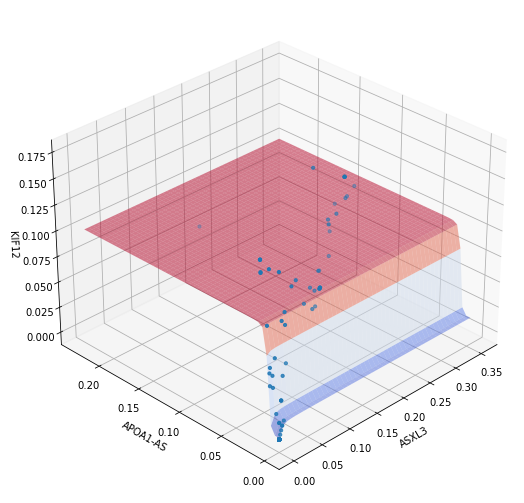

Best model keywords: AND
Best model AIC: -1144.2237748271602
Delta AIC: -134.73950655647502
Best model parameters: {'K_1': 0.0033288889030309156, 'K_2': 0.0037588660758356963, 'n_1': 1.2550369482985977, 'n_2': 1.0148494161516213, 'alpha_1': 0.10819138170186653}
Time elapse: 3.0499746799468994


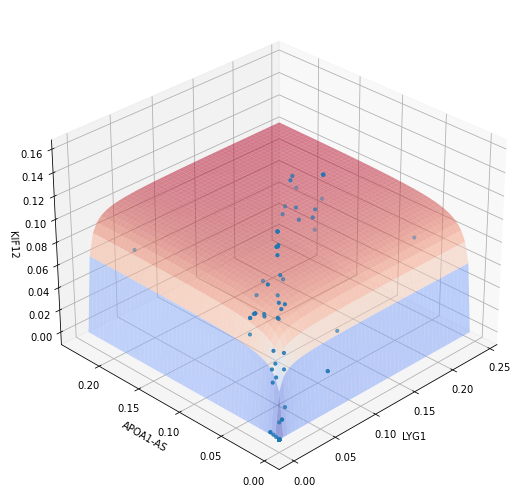

Best model keywords: AND
Best model AIC: -1085.5982843517938
Delta AIC: -117.66969495361161
Best model parameters: {'K_1': 0.0015384355520076767, 'K_2': 2.8475451389513967e-05, 'n_1': 0.6976575416535274, 'n_2': 1.344518211715942, 'alpha_1': 0.09621099960209946}
Time elapse: 2.260004997253418


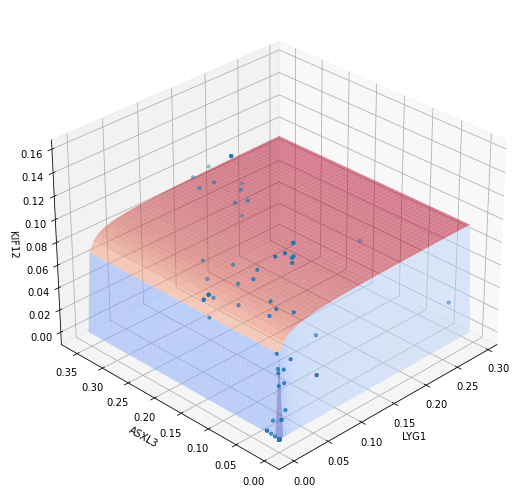

Best model keywords: Dual_Activation
Best model AIC: -1138.3681286431586
Delta AIC: -160.82934361994876
Best model parameters: {'K_1': 0.019557096278055318, 'K_2': 0.013385760241814095, 'n_1': 0.5014648730382331, 'n_2': 12.411069112675174, 'alpha_1': 0.10070320952910887, 'alpha_2': 0.05993913493146003, 'alpha_3': 0.100703209529109, 'alpha_4': 4.406647397764667e-18}
Time elapse: 2.585270404815674


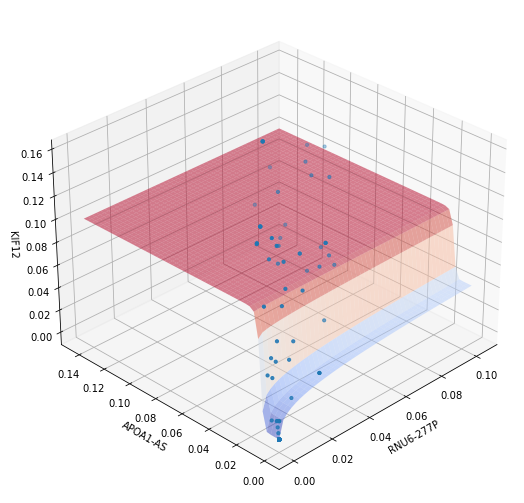

Best model keywords: AND
Best model AIC: -1050.899669901591
Delta AIC: -86.59528642466842
Best model parameters: {'K_1': 0.001456448306880001, 'K_2': 4.146886719501521e-05, 'n_1': 1.1915937340544276, 'n_2': 1.2090810168244979, 'alpha_1': 0.09319837663576122}
Time elapse: 2.673891544342041


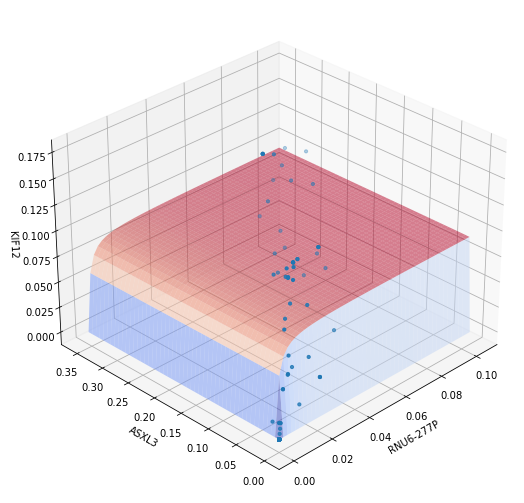

Best model keywords: Dual_Activation
Best model AIC: -1135.1319254611674
Delta AIC: -116.88179018755977
Best model parameters: {'K_1': 6.707036245320872e-05, 'K_2': 0.0067280735430213165, 'n_1': 1.1480731013470789, 'n_2': 1.2373339530383525, 'alpha_1': 0.1040525747739558, 'alpha_2': 0.007940368409220497, 'alpha_3': 0.02081463880576327, 'alpha_4': -3.1868994829732777e-18}
Time elapse: 2.8251800537109375


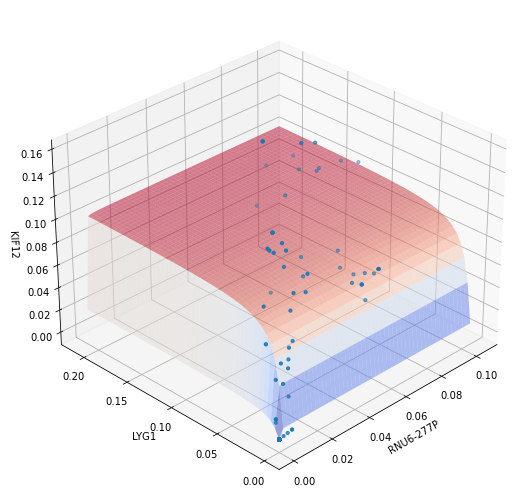

Best model keywords: AND
Best model AIC: -1105.175219223242
Delta AIC: -86.27546975683208
Best model parameters: {'K_1': 0.00013671605294036772, 'K_2': 0.007012318279957123, 'n_1': 0.9949505164469787, 'n_2': 1.2738106666393911, 'alpha_1': 0.10427281909253558}
Time elapse: 2.89029598236084


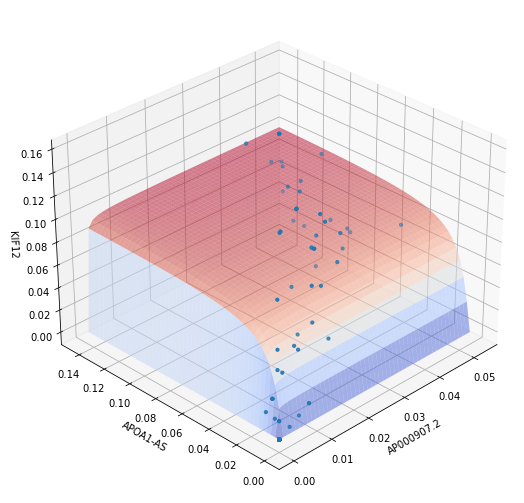

Best model keywords: AND
Best model AIC: -1069.228399515673
Delta AIC: -43.80732620965932
Best model parameters: {'K_1': 0.0015534506299797394, 'K_2': 4.4141252373223065e-05, 'n_1': 1.0123296018502217, 'n_2': 1.2609517737364753, 'alpha_1': 0.0995588722532069}
Time elapse: 2.842398166656494


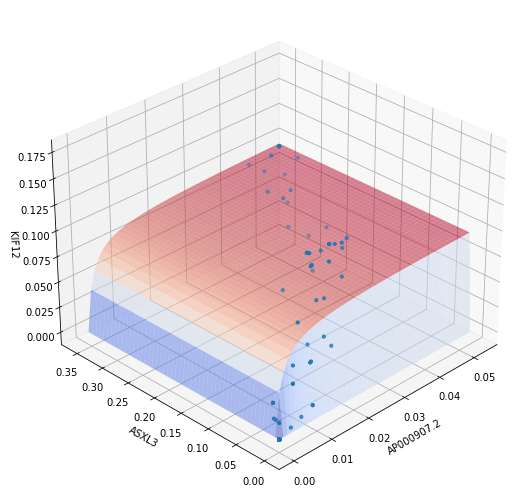

Best model keywords: AND
Best model AIC: -1163.5844027115527
Delta AIC: -117.17992878974383
Best model parameters: {'K_1': 0.0006467696835090206, 'K_2': 0.004318658969991997, 'n_1': 1.0042246557350478, 'n_2': 1.2514412958782655, 'alpha_1': 0.10650793795056623}
Time elapse: 3.2982192039489746


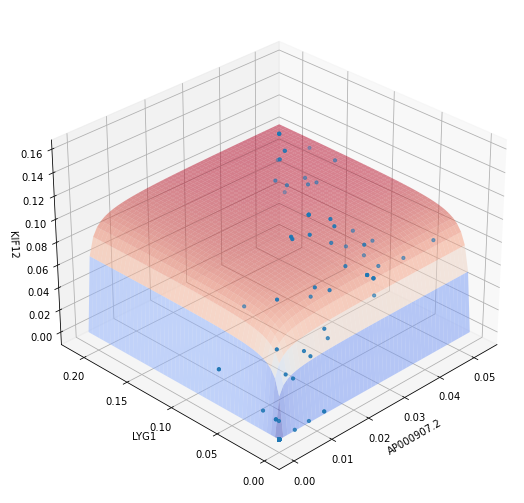

Best model keywords: OR
Best model AIC: -1089.400533886988
Delta AIC: -58.46344178508025
Best model parameters: {'K_1': 0.0024035211768577594, 'K_2': 0.0020056958568287126, 'n_1': 0.9291748803917518, 'n_2': 1.1732646612630446, 'alpha_1': 0.09772037376180165, 'alpha_2': 0.03786183536887029, 'alpha_3': 0.02408771168424914}
Time elapse: 2.9579315185546875


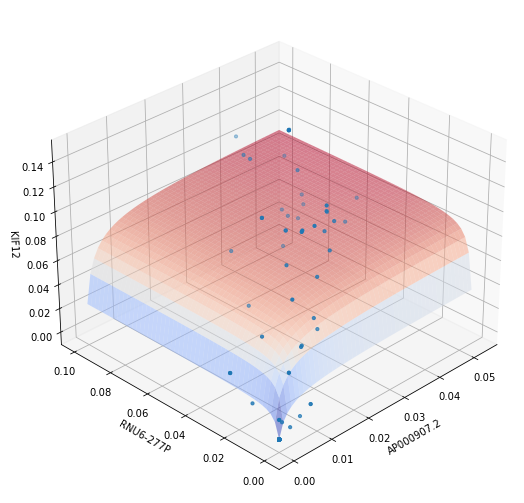

Best model keywords: AND
Best model AIC: -1105.2825744473141
Delta AIC: -87.28114336863314
Best model parameters: {'K_1': 0.0001775573369926251, 'K_2': 0.006919462537805202, 'n_1': 0.9967707048294447, 'n_2': 1.276652835759351, 'alpha_1': 0.1052340890971354}
Time elapse: 3.4084832668304443


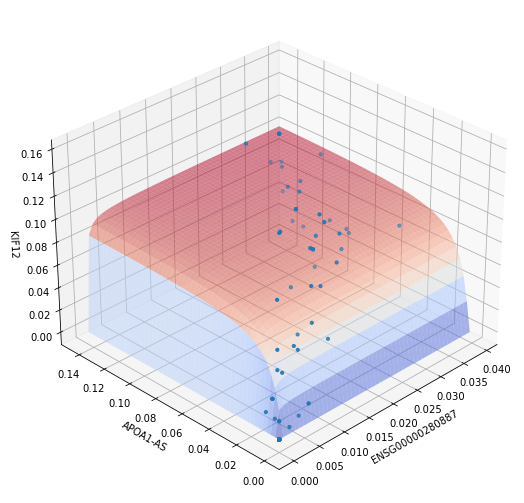

Best model keywords: AND
Best model AIC: -1072.9212716277611
Delta AIC: -94.30935532007334
Best model parameters: {'K_1': 0.0028011245937233616, 'K_2': 5.631756928046066e-05, 'n_1': 1.0070867962194343, 'n_2': 1.2580255385091872, 'alpha_1': 0.10500316757384316}
Time elapse: 3.184143304824829


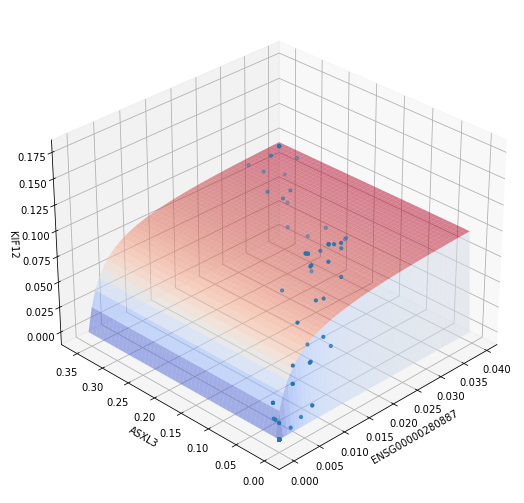

Best model keywords: AND
Best model AIC: -1163.389969741521
Delta AIC: -117.03023274490442
Best model parameters: {'K_1': 0.00017373067943947008, 'K_2': 0.0044563475701183885, 'n_1': 0.9936923105496152, 'n_2': 1.2593603615531517, 'alpha_1': 0.10399812829604943}
Time elapse: 3.109731674194336


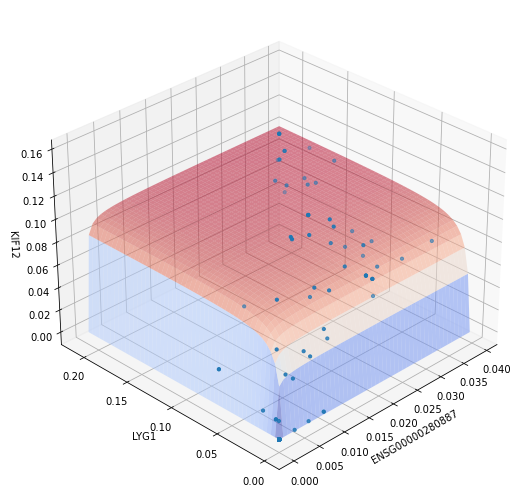

Best model keywords: AND
Best model AIC: -1089.676757510983
Delta AIC: -62.41189757621646
Best model parameters: {'K_1': 0.0032808811556020636, 'K_2': 5.3673426211056966e-05, 'n_1': 1.0070880744811828, 'n_2': 1.260088258831689, 'alpha_1': 0.10238359482448067}
Time elapse: 2.8951416015625


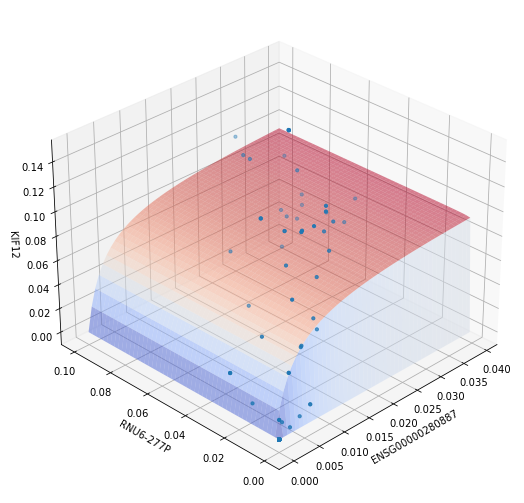

Best model keywords: AND
Best model AIC: -1153.6081801822709
Delta AIC: -24.27255243750642
Best model parameters: {'K_1': 0.011591157668023192, 'K_2': 0.0006941170845078482, 'n_1': 0.7799407836291338, 'n_2': 1.2769998165874807, 'alpha_1': 0.1430685193185429}
Time elapse: 2.973133087158203


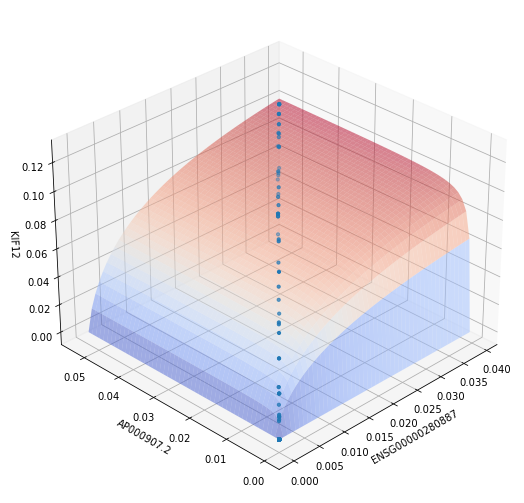

15 dual logic gates detected


In [6]:
# Traverse all possible dual logic gates
detected_dual_logi = []

for i in range(mat_inducer.head(6).shape[0]):
    for j in range(i):
        symbol_inducer = (symbol_inducer_list[i], symbol_inducer_list[j])
        count_x_all = (mat_inducer.iloc[i, :], mat_inducer.iloc[j, :])
        count_y_all = mat_reporter
        
        
        # outlier removal
        count_x = [0.0, 0.0]
        count_x[0], count_x[1], count_y = remove_outliers_3d(*count_x_all, count_y_all)

        # fitting
        count_x = np.array(count_x).transpose()    # convert to column vectors
        start_time = time.time()
        best_model, all_models = selectModel(count_x,
                                    count_y,
                                    modelSolver = ModelSolver.SLSQP,
                                    modelSet = ModelSet.Dual_Input,
                                    parallel = False,
                                    quiet = True)
        
        # storing
        specs, AIC, Delta_AIC, theta = extract_results(best_model, all_models)
        specs = ', '.join(specs)
        if "Linear" in specs:
            continue
        id_inducer_cur =\
            (mat_inducer.index.values[i], mat_inducer.index.values[j])
        detected_dual_logi.append([
            id_inducer_cur[0],
            id_inducer_cur[1],
            symbol_inducer[0],
            symbol_inducer[1],
            id_reporter,
            symbol_reporter,
            specs,
            AIC,
            Delta_AIC,
            theta
        ])
        
        # printing
        elapsed = time.time() - start_time
        best_model_specs = [spec.name for spec in best_model.modelSpecs]
        print("Best model keywords:", specs)
        print("Best model AIC:", AIC)
        print("Delta AIC:", Delta_AIC)
        print("Best model parameters:", theta)
        print("Time elapse:", elapsed)

        # plot
        fig = plt.figure(figsize = (12, 9))
        ax = fig.gca(projection = "3d")
        plotHelper3D(count_x,
                count_y,
                best_model,
                ax = ax,
                inducer_name = symbol_inducer,
                reporter_name = symbol_reporter,
                logScale = False)
        
detected_dual_logi = pd.DataFrame(detected_dual_logi,
                                 columns = ("id_inducer_1", "id_inducer_2",
                                           "symbol_inducer_1", "symbol_inducer_2",
                                            "id_reporter", "symbol_reporter",
                                           "specs", "AIC",
                                           "Delta_AIC", "theta"))
print(detected_dual_logi.shape[0], "dual logic gates detected")
detected_dual_logi.to_csv("../data/GSE75748/detected_dual_logi.tsv", sep = '\t', index = False)

In [7]:
# Traverse all possible dual logic gates
detected_dual_logi = []

for i in range(mat_inducer.shape[0]):
    for j in range(i):
        symbol_inducer = (symbol_inducer_list[i], symbol_inducer_list[j])
        count_x_all = (mat_inducer.iloc[i, :], mat_inducer.iloc[j, :])
        count_y_all = mat_reporter
        
        
        # outlier removal
        count_x = [0.0, 0.0]
        count_x[0], count_x[1], count_y = remove_outliers_3d(*count_x_all, count_y_all)

        # fitting
        count_x = np.array(count_x).transpose()    # convert to column vectors
        start_time = time.time()
        best_model, all_models = selectModel(count_x,
                                    count_y,
                                    modelSolver = ModelSolver.SLSQP,
                                    modelSet = ModelSet.Dual_Input,
                                    parallel = False,
                                    quiet = True)
        
        # storing
        specs, AIC, Delta_AIC, theta = extract_results(best_model, all_models)
        specs = ', '.join(specs)
        if "Linear" in specs:
            continue
        id_inducer_cur =\
            (mat_inducer.index.values[i], mat_inducer.index.values[j])
        detected_dual_logi.append([
            id_inducer_cur[0],
            id_inducer_cur[1],
            symbol_inducer[0],
            symbol_inducer[1],
            id_reporter,
            symbol_reporter,
            specs,
            AIC,
            Delta_AIC,
            theta
        ])
        
#         # printing
#         elapsed = time.time() - start_time
#         best_model_specs = [spec.name for spec in best_model.modelSpecs]
#         print("Best model keywords:", specs)
#         print("Best model AIC:", AIC)
#         print("Delta AIC:", Delta_AIC)
#         print("Best model parameters:", theta)
#         print("Time elapse:", elapsed)

#         # plot
#         fig = plt.figure(figsize = (12, 9))
#         ax = fig.gca(projection = "3d")
#         plotHelper3D(count_x,
#                 count_y,
#                 best_model,
#                 ax = ax,
#                 inducer_name = symbol_inducer,
#                 reporter_name = symbol_reporter,
#                 logScale = False)
        
detected_dual_logi = pd.DataFrame(detected_dual_logi,
                                 columns = ("id_inducer_1", "id_inducer_2",
                                           "symbol_inducer_1", "symbol_inducer_2",
                                            "id_reporter", "symbol_reporter",
                                           "specs", "AIC",
                                           "Delta_AIC", "theta"))
print(detected_dual_logi.shape[0], "dual logic gates detected")
detected_dual_logi.to_csv("../data/GSE75748/detected_dual_logi.tsv", sep = '\t', index = False)

3356 dual logic gates detected


In [18]:
# filter the detected logic gates

detected_dual_logi = pd.read_csv("../data/GSE75748/detected_dual_logi.tsv", sep = "\t")
display(detected_dual_logi.head())
rigid_detected_dual_logi = detected_dual_logi[
    (detected_dual_logi["AIC"] < -1000) & (detected_dual_logi["Delta_AIC"] < -200)
]
display(rigid_detected_dual_logi.head())
print(rigid_detected_dual_logi.shape[0], "rigid dual logic gates detected")
# unique inducer RNAs
unique_inducers = np.unique(np.ravel(rigid_detected_dual_logi[['symbol_inducer_1', 'symbol_inducer_2']].to_numpy()))
print(len(unique_inducers), "unique inducer RNAs")
print(unique_inducers)

,id_inducer_1,id_inducer_2,symbol_inducer_1,symbol_inducer_2,id_reporter,symbol_reporter,specs,AIC,Delta_AIC,theta
0,ENSG00000141431.9,ENSG00000235910.1,ASXL3,APOA1-AS,ENSG00000136883.12,KIF12,Dual_Activation,-1121.421472,-155.293642,"{'K_1': 0.003773928013635261, 'K_2': 0.0127274..."
1,ENSG00000144214.9,ENSG00000235910.1,LYG1,APOA1-AS,ENSG00000136883.12,KIF12,AND,-1144.223775,-134.739507,"{'K_1': 0.0033288889030309156, 'K_2': 0.003758..."
2,ENSG00000144214.9,ENSG00000141431.9,LYG1,ASXL3,ENSG00000136883.12,KIF12,AND,-1085.598284,-117.669695,"{'K_1': 0.0015384355520076767, 'K_2': 2.847545..."
3,ENSG00000252081.1,ENSG00000235910.1,RNU6-277P,APOA1-AS,ENSG00000136883.12,KIF12,Dual_Activation,-1138.368129,-160.829344,"{'K_1': 0.019557096278055318, 'K_2': 0.0133857..."
4,ENSG00000252081.1,ENSG00000141431.9,RNU6-277P,ASXL3,ENSG00000136883.12,KIF12,AND,-1050.899670,-86.595286,"{'K_1': 0.001456448306880001, 'K_2': 4.1468867..."


,id_inducer_1,id_inducer_2,symbol_inducer_1,symbol_inducer_2,id_reporter,symbol_reporter,specs,AIC,Delta_AIC,theta
41,ENSG00000200537.1,ENSG00000144214.9,RNY4P6,LYG1,ENSG00000136883.12,KIF12,OR,-1425.640600,-245.509559,"{'K_1': 0.066196914514533, 'K_2': 0.0695831568..."
42,ENSG00000200537.1,ENSG00000252081.1,RNY4P6,RNU6-277P,ENSG00000136883.12,KIF12,OR,-1354.095417,-253.525549,"{'K_1': 0.06051352222541038, 'K_2': 0.05732166..."
51,ENSG00000236920.2,ENSG00000144214.9,AL590727.1,LYG1,ENSG00000136883.12,KIF12,OR,-1249.499507,-222.851827,"{'K_1': 0.019112088339427662, 'K_2': 0.0197721..."
62,ENSG00000254806.5,ENSG00000144214.9,SYS1-DBNDD2,LYG1,ENSG00000136883.12,KIF12,Dual_Activation,-1297.764885,-226.148758,"{'K_1': 0.011608832855660292, 'K_2': 0.0100123..."
122,ENSG00000188886.3,ENSG00000254806.5,ASTL,SYS1-DBNDD2,ENSG00000136883.12,KIF12,AND,-1253.894402,-201.331917,"{'K_1': 0.003586195071431594, 'K_2': 0.0048196..."


82 rigid dual logic gates detected
60 unique inducer RNAs
['AC005306.1' 'AC011352.2' 'AC013356.3' 'AC020558.2' 'AC024610.2'
 'AC078778.1' 'AC083964.2' 'AC087627.1' 'AC090510.2' 'AC090985.1' 'AKT3'
 'AL021937.1' 'AL023807.1' 'AL049820.1' 'AL133368.1' 'AL136140.1'
 'AL138752.2' 'AL157871.2' 'AL353748.2' 'AL590727.1' 'AP000907.2'
 'APOA1-AS' 'ASTL' 'ASXL3' 'BGLAP' 'CCDC189' 'CDKN2A' 'CELA2B' 'CSRP1'
 'ECM1' 'ENSG00000270750' 'ENSG00000280887' 'GRHL3' 'KHDRBS2-OT1'
 'L3MBTL2-AS1' 'LINC00383' 'LYG1' 'LZTS1-AS1' 'MFFP1' 'MIR3173' 'MIR3174'
 'MIR558' 'MTND2P32' 'NHLRC1' 'PAX7' 'PCDHGB5' 'RN7SKP295' 'RN7SL502P'
 'RNU6-277P' 'RNU6-31P' 'RNU6ATAC12P' 'RNU7-123P' 'RNY4P6' 'RUNX3' 'SEZ6L'
 'SLC6A12' 'SYS1-DBNDD2' 'TAS2R5' 'TEX13B' 'Y_RNA']


Inducer RNAs: RNY4P6 LYG1
Best model keywords: OR
Best model AIC: -1425.6406000377535
Delta AIC: -245.50955873565658
Best model parameters: {'K_1': 0.066196914514533, 'K_2': 0.06958315689538176, 'n_1': 0.9509086643067547, 'n_2': 1.129676535565313, 'alpha_1': 0.3194154298310767, 'alpha_2': 0.3194154298310767, 'alpha_3': 0.07158246249197081}


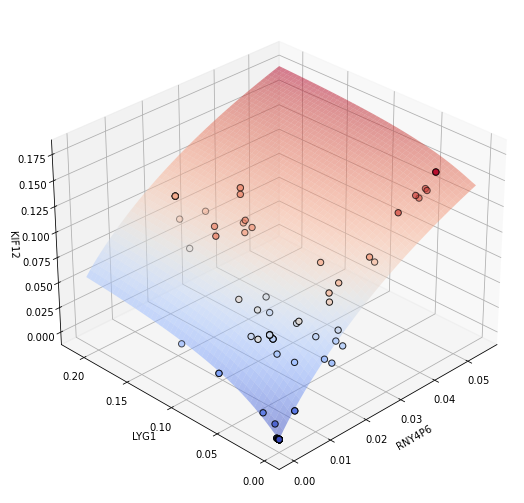

Inducer RNAs: RNY4P6 RNU6-277P
Best model keywords: OR
Best model AIC: -1354.095417239722
Delta AIC: -253.5255492332867
Best model parameters: {'K_1': 0.06051352222541038, 'K_2': 0.057321661685735006, 'n_1': 1.2422464218682745, 'n_2': 1.1533811534524125, 'alpha_1': 0.3370124297871437, 'alpha_2': 0.3370124297871437, 'alpha_3': 0.09385455808198662}


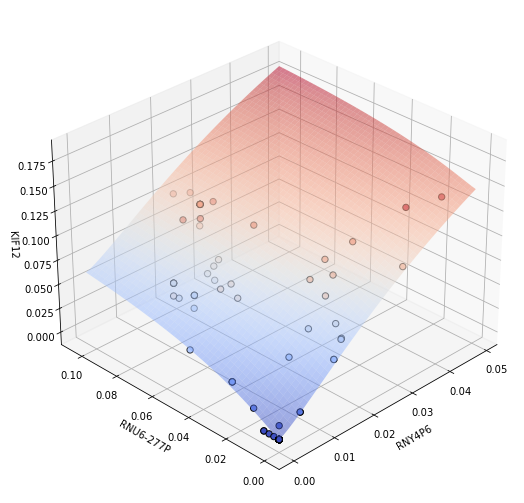

Inducer RNAs: AL590727.1 LYG1
Best model keywords: OR
Best model AIC: -1249.499507401582
Delta AIC: -222.8518274227706
Best model parameters: {'K_1': 0.019112088339427662, 'K_2': 0.019772167104073753, 'n_1': 6.844165151677648, 'n_2': 1.2307749278644158, 'alpha_1': 0.11266809549112505, 'alpha_2': 0.11266809549112511, 'alpha_3': 0.0822250869024953}


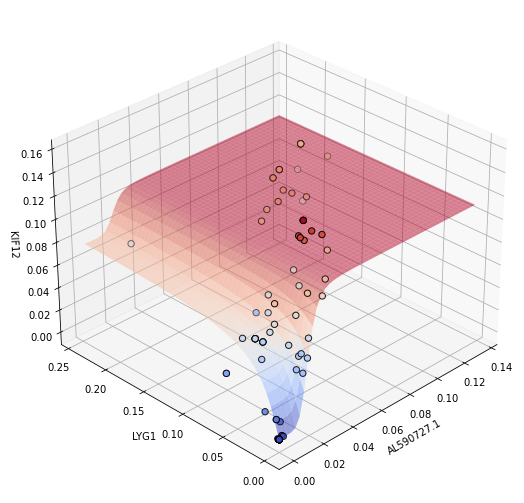

Inducer RNAs: SYS1-DBNDD2 LYG1
Best model keywords: Dual_Activation
Best model AIC: -1297.7648845206118
Delta AIC: -226.1487583631847
Best model parameters: {'K_1': 0.011608832855660292, 'K_2': 0.010012365471655862, 'n_1': 1.4487291869193872, 'n_2': 1.6061418009455277, 'alpha_1': 0.13399314150152333, 'alpha_2': 0.13399314150152294, 'alpha_3': 0.05428797278360115, 'alpha_4': 0.00016302990418146925}


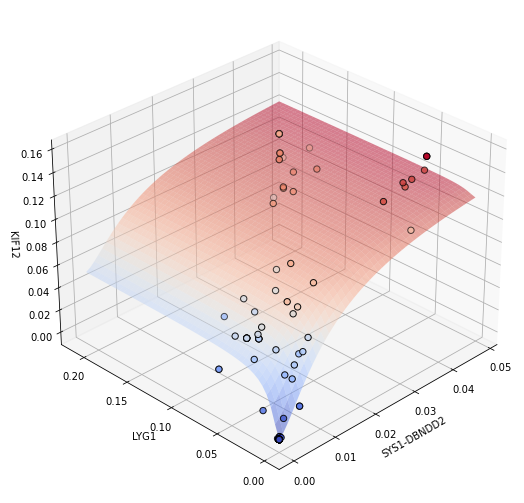

Inducer RNAs: ASTL SYS1-DBNDD2
Best model keywords: AND
Best model AIC: -1253.8944021186333
Delta AIC: -201.33191748117997
Best model parameters: {'K_1': 0.003586195071431594, 'K_2': 0.00481969024089368, 'n_1': 1.3027630746382772, 'n_2': 0.4974863142128807, 'alpha_1': 0.1612040221559987}


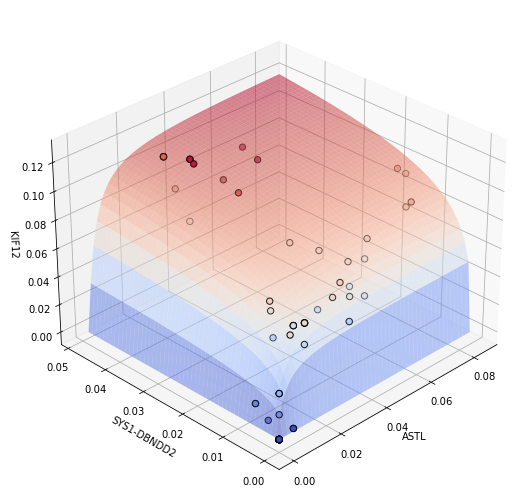

Inducer RNAs: AL133368.1 RNY4P6
Best model keywords: Dual_Activation
Best model AIC: -1257.0578010991603
Delta AIC: -230.67480920037633
Best model parameters: {'K_1': 0.0052256021684176715, 'K_2': 0.046946767981132766, 'n_1': 1.2249762492765914, 'n_2': 0.9347232226362469, 'alpha_1': 0.27691822122062776, 'alpha_2': 0.02384063935834313, 'alpha_3': 0.21508132949186892, 'alpha_4': 9.221609336622317e-20}


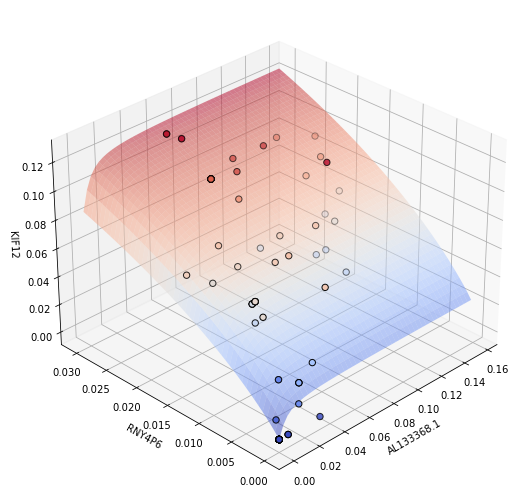

Inducer RNAs: AL138752.2 AC005306.1
Best model keywords: OR
Best model AIC: -1251.0113113441482
Delta AIC: -232.47773405782664
Best model parameters: {'K_1': 0.006308084114550232, 'K_2': 0.01304957340040169, 'n_1': 5.443119290210597, 'n_2': 19.369045384360437, 'alpha_1': 0.11166870901042097, 'alpha_2': 0.06704826155746026, 'alpha_3': 0.07175684593270965}


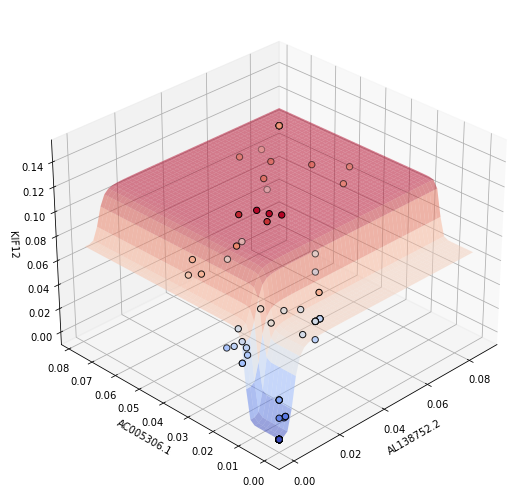

Inducer RNAs: AL138752.2 ASTL
Best model keywords: OR
Best model AIC: -1325.3738561692983
Delta AIC: -243.62526104222843
Best model parameters: {'K_1': 0.02940833718296372, 'K_2': 0.18218622209405186, 'n_1': 0.8734129312271373, 'n_2': 1.021036113585551, 'alpha_1': 0.42075020887324094, 'alpha_2': 0.10288223517234332, 'alpha_3': 0.3134872052524875}


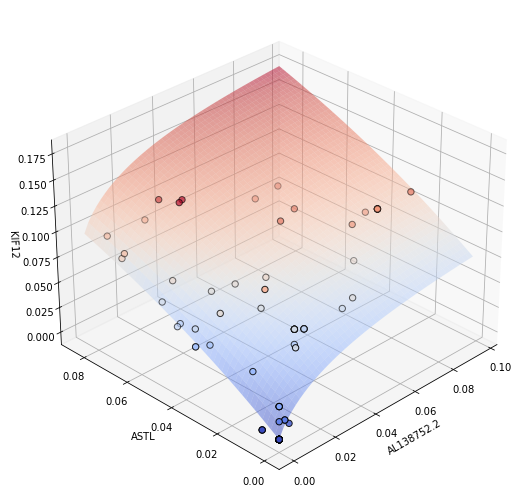

Inducer RNAs: ENSG00000270750 RNY4P6
Best model keywords: OR
Best model AIC: -1337.6565989609483
Delta AIC: -296.5519612644173
Best model parameters: {'K_1': 0.11100730425505649, 'K_2': 0.12276640954036375, 'n_1': 1.136054706408734, 'n_2': 0.8716300010080826, 'alpha_1': 0.44439080364951833, 'alpha_2': 0.07880172870173008, 'alpha_3': 0.44439080364951833}


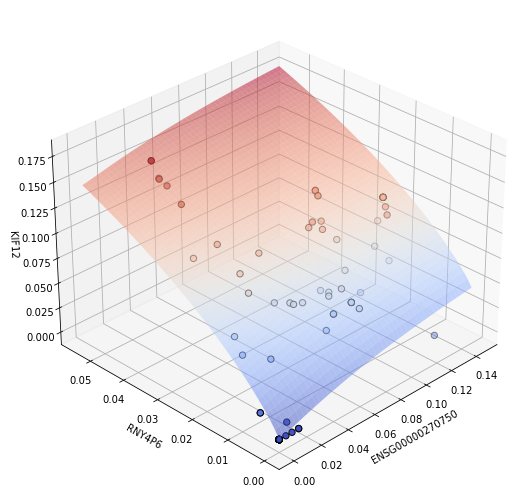

Inducer RNAs: GRHL3 AL133368.1
Best model keywords: Dual_Activation
Best model AIC: -1231.9874414825176
Delta AIC: -218.5729914233109
Best model parameters: {'K_1': 0.02618162058897116, 'K_2': 0.033310411566548445, 'n_1': 2.139606967946701, 'n_2': 81.42814157300847, 'alpha_1': 0.09708863255141019, 'alpha_2': 0.09708863255141041, 'alpha_3': 0.09708863255141033, 'alpha_4': 0.0001927284257426065}


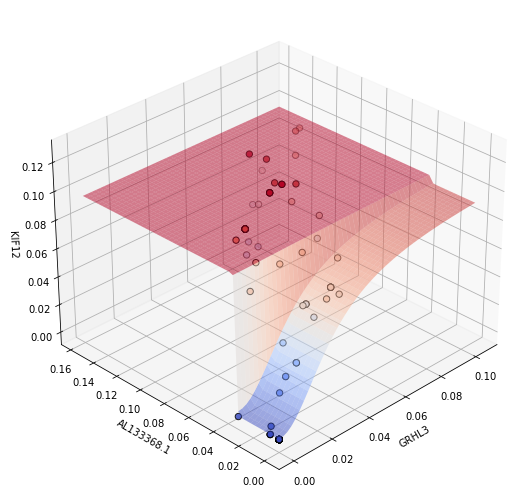

Inducer RNAs: MIR558 RNY4P6
Best model keywords: Dual_Activation
Best model AIC: -1229.885587782986
Delta AIC: -248.36859545953234
Best model parameters: {'K_1': 0.04512575531943212, 'K_2': 0.013111397046755941, 'n_1': 0.8580503492220284, 'n_2': 1.2596901438034478, 'alpha_1': 0.15918247446703793, 'alpha_2': 0.015429782040071649, 'alpha_3': 0.15918247446703784, 'alpha_4': 0.001778759436596083}


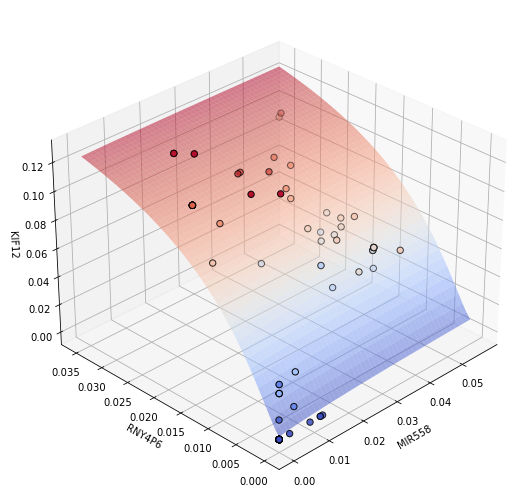

Inducer RNAs: AC090510.2 RNY4P6
Best model keywords: OR
Best model AIC: -1219.9176123510429
Delta AIC: -236.6797733196197
Best model parameters: {'K_1': 0.0007068258602519039, 'K_2': 0.015632913807883023, 'n_1': 0.961611148194211, 'n_2': 1.3209295258620988, 'alpha_1': 0.16678331025700463, 'alpha_2': 0.016584289714203407, 'alpha_3': 0.16678331025700463}


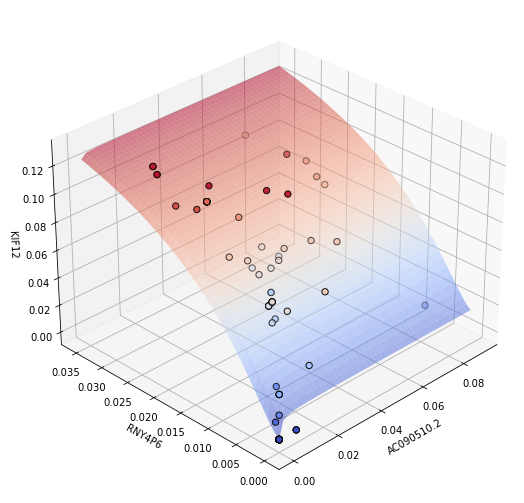

Inducer RNAs: SLC6A12 KHDRBS2-OT1
Best model keywords: Dual_Activation
Best model AIC: -1183.052154158795
Delta AIC: -212.5318119956579
Best model parameters: {'K_1': 0.08426081318905547, 'K_2': 0.0209146805489437, 'n_1': 2.545986421052806, 'n_2': 20.443557821160507, 'alpha_1': 0.09721391955999033, 'alpha_2': 0.09721391955999033, 'alpha_3': 0.09721391955999031, 'alpha_4': 0.001994345266903839}


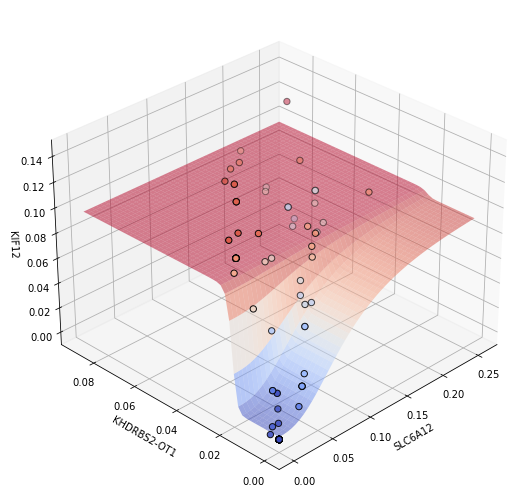

Inducer RNAs: NHLRC1 RNY4P6
Best model keywords: Dual_Activation
Best model AIC: -1241.548962821336
Delta AIC: -207.31040762273597
Best model parameters: {'K_1': 0.047550652838616064, 'K_2': 0.22321734329492565, 'n_1': 1.1931161059259505, 'n_2': 0.7688202652003779, 'alpha_1': 0.6432802850093217, 'alpha_2': 0.027679193769985667, 'alpha_3': 0.6432802850093217, 'alpha_4': 7.859186014588908e-20}


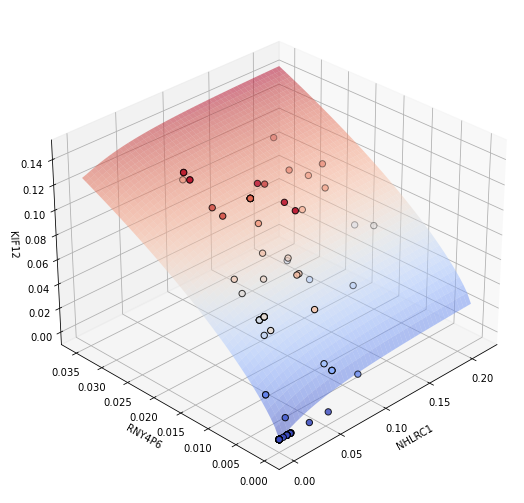

Inducer RNAs: LZTS1-AS1 SYS1-DBNDD2
Best model keywords: AND
Best model AIC: -1241.6190139672417
Delta AIC: -222.17935425042924
Best model parameters: {'K_1': 0.00041899569162160734, 'K_2': 0.010689406587110841, 'n_1': 1.3235615432929757, 'n_2': 0.500503188938621, 'alpha_1': 0.18244030105668904}


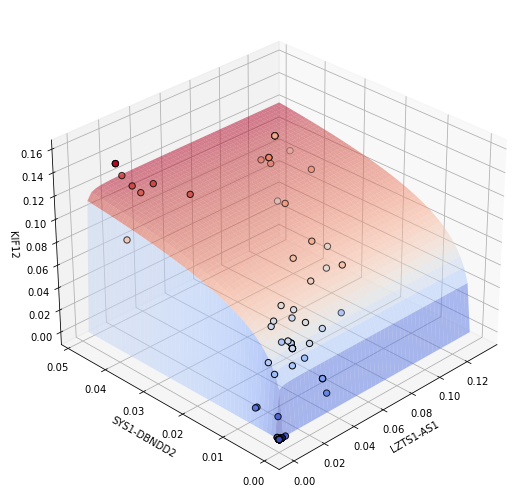

Inducer RNAs: MIR3174 RNY4P6
Best model keywords: AND
Best model AIC: -1285.3461608934467
Delta AIC: -266.19237690794625
Best model parameters: {'K_1': 0.002081432254889352, 'K_2': 0.014201927648301624, 'n_1': 1.2563904044364593, 'n_2': 0.9596013933056858, 'alpha_1': 0.18994817945115472}


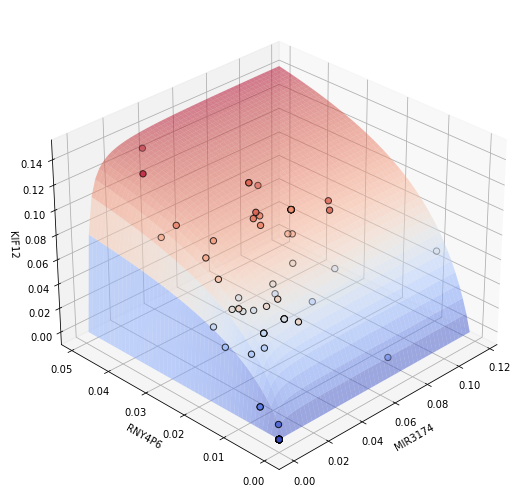

Inducer RNAs: MIR3174 AL590727.1
Best model keywords: AND
Best model AIC: -1212.417235214939
Delta AIC: -209.28825783802813
Best model parameters: {'K_1': 0.0009073545077765354, 'K_2': 0.006426208618255235, 'n_1': 0.9974689522170432, 'n_2': 1.249814457891859, 'alpha_1': 0.12116309149816366}


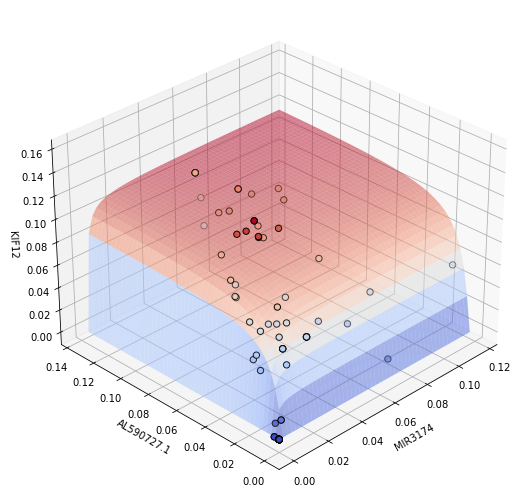

Inducer RNAs: MIR3174 SYS1-DBNDD2
Best model keywords: AND
Best model AIC: -1285.8485226893717
Delta AIC: -273.0446695733391
Best model parameters: {'K_1': 0.0021663851576023034, 'K_2': 0.003513285657395562, 'n_1': 1.384381750252484, 'n_2': 0.4312196622551757, 'alpha_1': 0.15887260816437962}


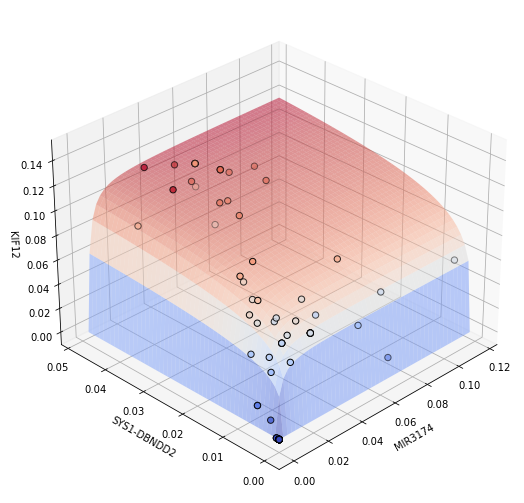

Inducer RNAs: MIR3174 RNU6ATAC12P
Best model keywords: AND
Best model AIC: -1220.984863791365
Delta AIC: -223.50197813374098
Best model parameters: {'K_1': 0.00059292562685208, 'K_2': 0.006441588122345608, 'n_1': 1.003706223643441, 'n_2': 1.2487277381106292, 'alpha_1': 0.12002400231763721}


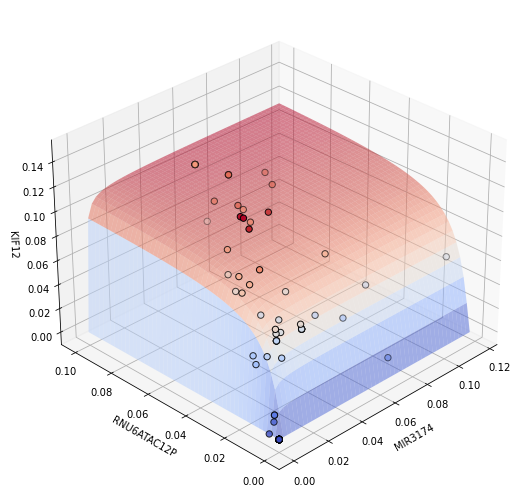

Inducer RNAs: ECM1 KHDRBS2-OT1
Best model keywords: Dual_Activation
Best model AIC: -1356.1122301452692
Delta AIC: -234.96246887635562
Best model parameters: {'K_1': 0.07552525936229601, 'K_2': 0.13651285759001963, 'n_1': 17.47404188389619, 'n_2': 1.0029558609463114, 'alpha_1': 0.3047365440066085, 'alpha_2': 0.05511296037076977, 'alpha_3': 0.2164622180250058, 'alpha_4': 2.8378568779770605e-19}


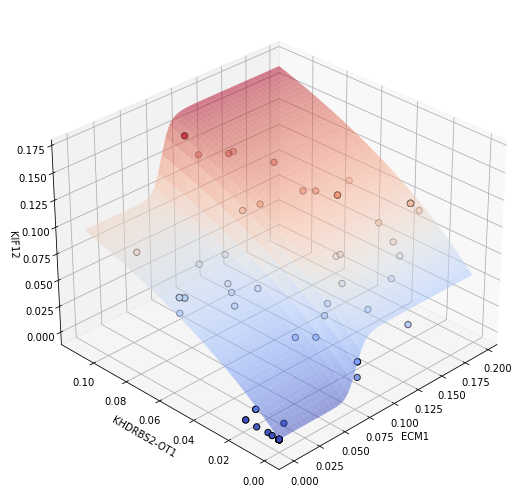

Inducer RNAs: RNU7-123P AP000907.2
Best model keywords: AND
Best model AIC: -1258.937245600531
Delta AIC: -208.8682010613038
Best model parameters: {'K_1': 0.0029305352075719685, 'K_2': 0.0048611811776035525, 'n_1': 1.001190484506125, 'n_2': 1.2544364391580938, 'alpha_1': 0.12676219799195088}


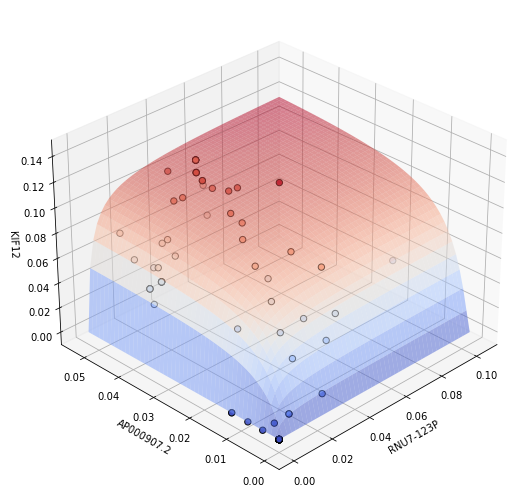

Inducer RNAs: RNU7-123P ENSG00000280887
Best model keywords: AND
Best model AIC: -1258.9069149577308
Delta AIC: -220.25380237826835
Best model parameters: {'K_1': 0.003022779245236003, 'K_2': 0.003753414585357506, 'n_1': 1.0015334530603641, 'n_2': 1.253169300662179, 'alpha_1': 0.1277170868296961}


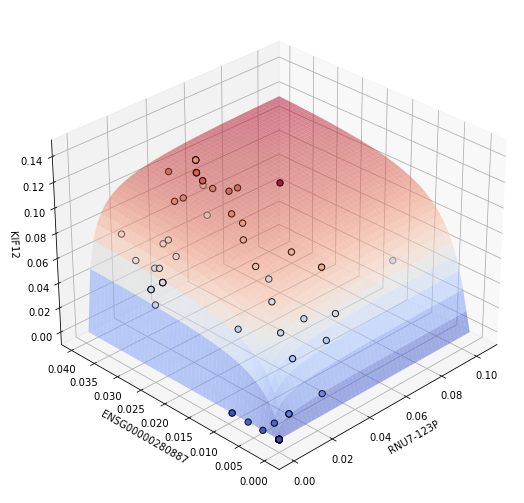

Inducer RNAs: RNU7-123P RNY4P6
Best model keywords: OR
Best model AIC: -1248.6581710417488
Delta AIC: -210.71697456933111
Best model parameters: {'K_1': 0.0020364535117890176, 'K_2': 0.015945121586054753, 'n_1': 0.7132612367687982, 'n_2': 1.1700017198106114, 'alpha_1': 0.17230809775051067, 'alpha_2': 0.029645018486249904, 'alpha_3': 0.10842236888199665}


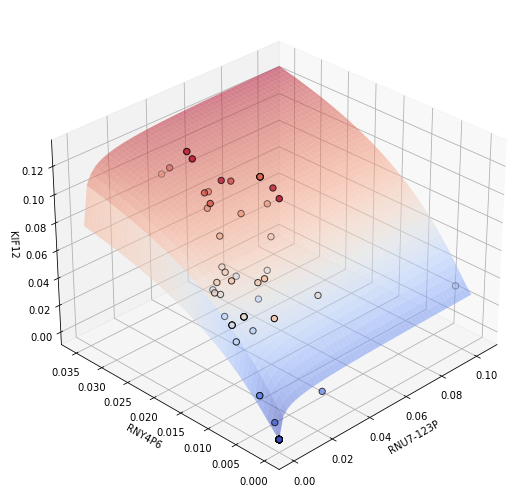

Inducer RNAs: RN7SKP295 AL138752.2
Best model keywords: Dual_Activation
Best model AIC: -1306.2392725537525
Delta AIC: -222.08204545690023
Best model parameters: {'K_1': 0.016582820910751108, 'K_2': 0.02723277243717008, 'n_1': 3.106954683110982, 'n_2': 0.7832423276725656, 'alpha_1': 0.1402764901922792, 'alpha_2': 0.07550478091315559, 'alpha_3': 0.1402764901922792, 'alpha_4': 0.0009642036551642296}


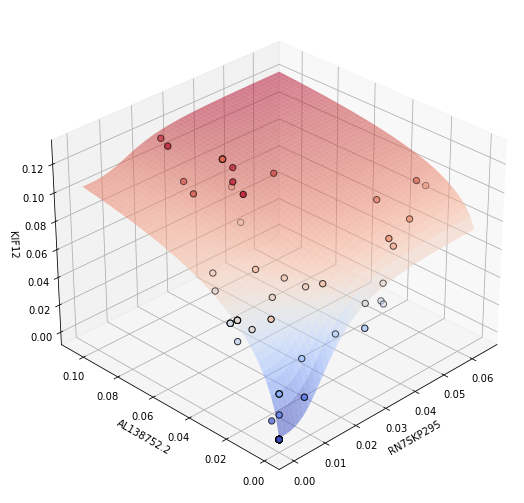

Inducer RNAs: AL353748.2 RNY4P6
Best model keywords: Dual_Activation
Best model AIC: -1296.5738319891618
Delta AIC: -259.401677757681
Best model parameters: {'K_1': 0.3226758896807998, 'K_2': 0.09030611234626902, 'n_1': 1.150205948668434, 'n_2': 0.6611583929937193, 'alpha_1': 0.36632743434918863, 'alpha_2': 0.24949182047742569, 'alpha_3': 0.3182522430125076, 'alpha_4': -1.452117748519635e-19}


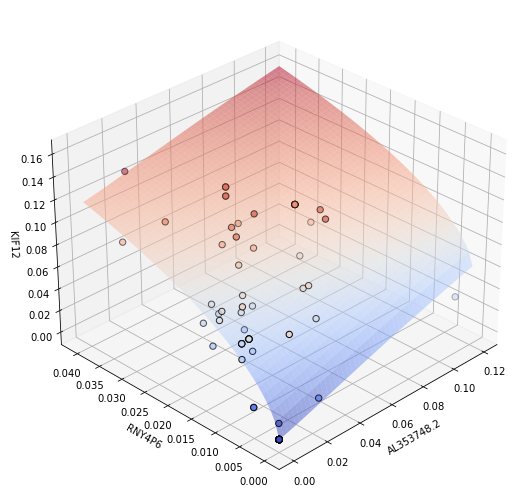

Inducer RNAs: AL353748.2 SYS1-DBNDD2
Best model keywords: Dual_Activation
Best model AIC: -1234.9588584790858
Delta AIC: -210.65982972107804
Best model parameters: {'K_1': 0.00333857580168594, 'K_2': 0.005674313781162548, 'n_1': 1.2735724500309935, 'n_2': 0.6233718076733851, 'alpha_1': 0.13882453767507064, 'alpha_2': 0.02768019622403959, 'alpha_3': 0.0882256369810255, 'alpha_4': 3.4713623870155884e-20}


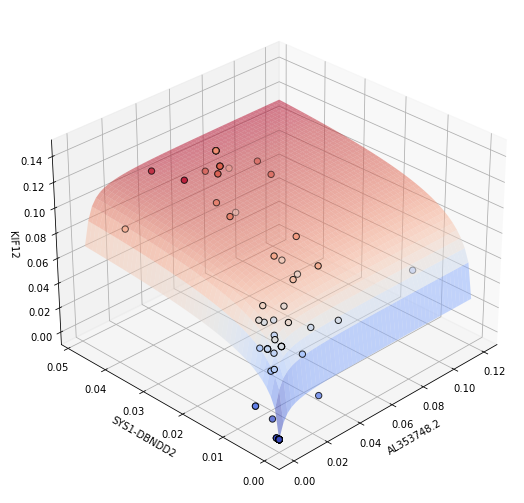

Inducer RNAs: CDKN2A ENSG00000280887
Best model keywords: OR
Best model AIC: -1270.6150163402688
Delta AIC: -210.55826797259965
Best model parameters: {'K_1': 0.017089939257491575, 'K_2': 0.2742956924357504, 'n_1': 1.1104470960335298, 'n_2': 0.7460809390885837, 'alpha_1': 0.49431248495631797, 'alpha_2': 0.06404903248747294, 'alpha_3': 0.3869327643652006}


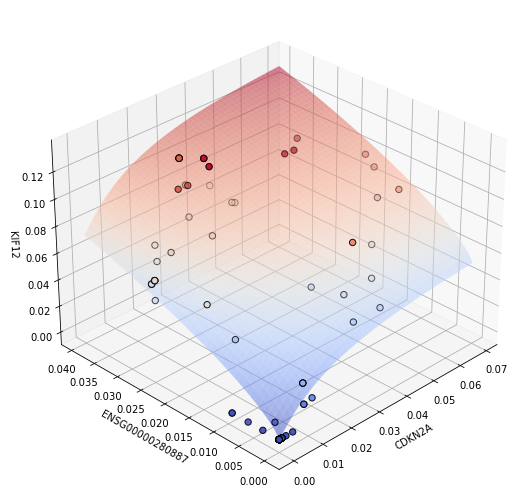

Inducer RNAs: AL023807.1 RN7SL502P
Best model keywords: OR
Best model AIC: -1295.4407417007478
Delta AIC: -203.97803413361498
Best model parameters: {'K_1': 0.014731737396500286, 'K_2': 0.06625864155551926, 'n_1': 1.979430055988479, 'n_2': 1.7578953107953519, 'alpha_1': 0.20173628460468038, 'alpha_2': 0.04279988894428741, 'alpha_3': 0.07192036407037276}


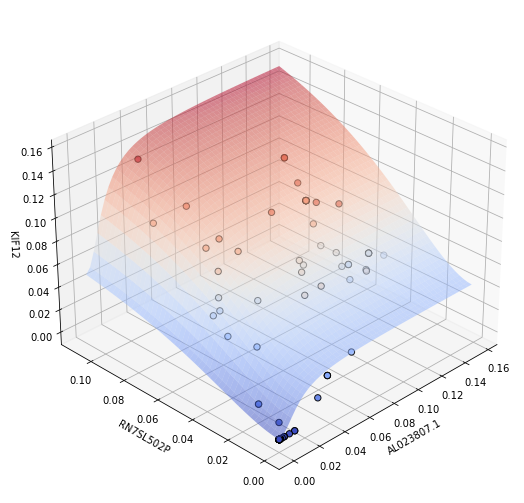

Inducer RNAs: AL157871.2 AP000907.2
Best model keywords: OR
Best model AIC: -1260.4867942781457
Delta AIC: -230.93291482302743
Best model parameters: {'K_1': 0.1492204311875531, 'K_2': 0.04658446977879812, 'n_1': 0.5857256194376347, 'n_2': 0.6842372148778205, 'alpha_1': 0.7372753243355682, 'alpha_2': 0.03791768915717473, 'alpha_3': 0.033240768509193774}


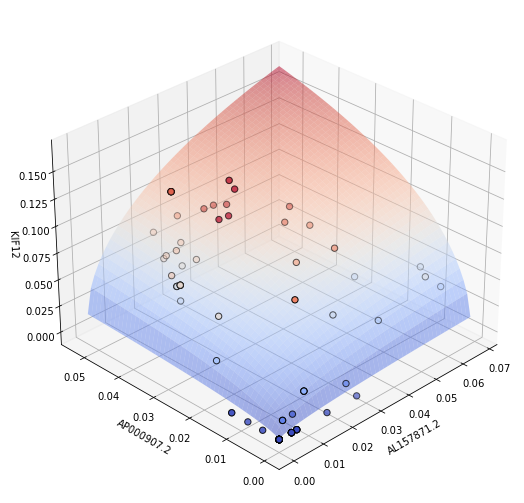

Inducer RNAs: AL157871.2 ENSG00000280887
Best model keywords: AND
Best model AIC: -1260.6045368295927
Delta AIC: -213.91256146650107
Best model parameters: {'K_1': 0.009865186022754454, 'K_2': 0.004710262107492909, 'n_1': 0.9920646581227474, 'n_2': 1.2513485664609418, 'alpha_1': 0.16473345472812506}


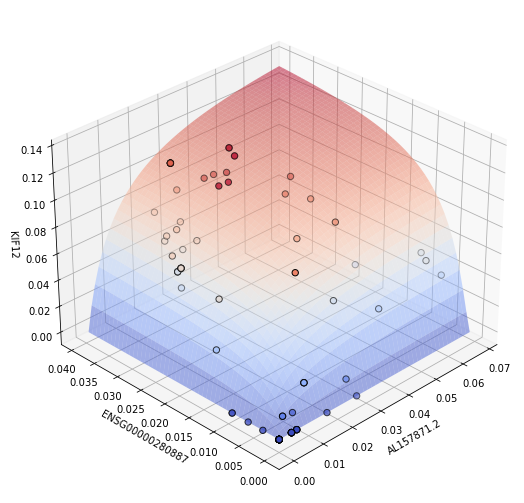

Inducer RNAs: AL157871.2 RNY4P6
Best model keywords: AND
Best model AIC: -1236.1701449902912
Delta AIC: -223.55436476786667
Best model parameters: {'K_1': 0.0009394573851504593, 'K_2': 0.011414630201649822, 'n_1': 1.2742595116556916, 'n_2': 0.9944552154347706, 'alpha_1': 0.16268390120274834}


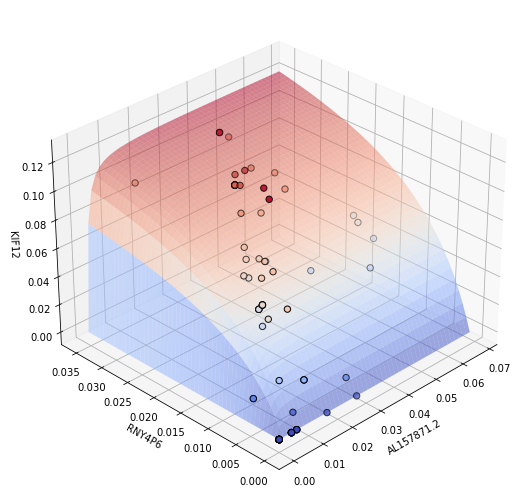

Inducer RNAs: SEZ6L AL021937.1
Best model keywords: OR
Best model AIC: -1219.0237115108716
Delta AIC: -272.4616318557328
Best model parameters: {'K_1': 0.04521981992345725, 'K_2': 0.029366592850985987, 'n_1': 1.8488342683167467, 'n_2': 0.698130022833231, 'alpha_1': 0.18727869621343954, 'alpha_2': -0.16528542055683335, 'alpha_3': 0.18727869621343957}


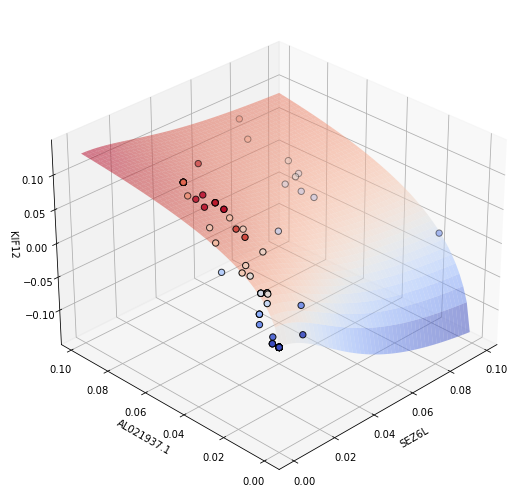

Inducer RNAs: SEZ6L L3MBTL2-AS1
Best model keywords: OR
Best model AIC: -1224.996530921458
Delta AIC: -223.23878713155023
Best model parameters: {'K_1': 0.004168942441098149, 'K_2': 0.0339113921592118, 'n_1': 5.588971374597392, 'n_2': 14.671838855533933, 'alpha_1': 0.09838876459320105, 'alpha_2': 0.008281565055628354, 'alpha_3': 0.06237756565040683}


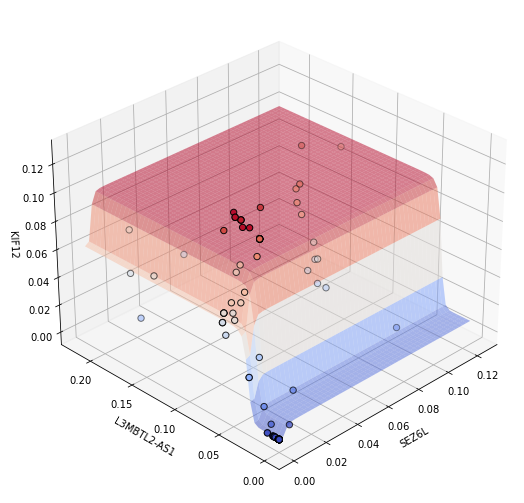

Inducer RNAs: AKT3 RNY4P6
Best model keywords: OR
Best model AIC: -1255.265256200695
Delta AIC: -206.4667252520344
Best model parameters: {'K_1': 0.08080012282350779, 'K_2': 0.05140363871450808, 'n_1': 1.0687128880376058, 'n_2': 0.772575058719702, 'alpha_1': 0.2850113199132449, 'alpha_2': 0.04870953702063899, 'alpha_3': 0.2850113199132449}


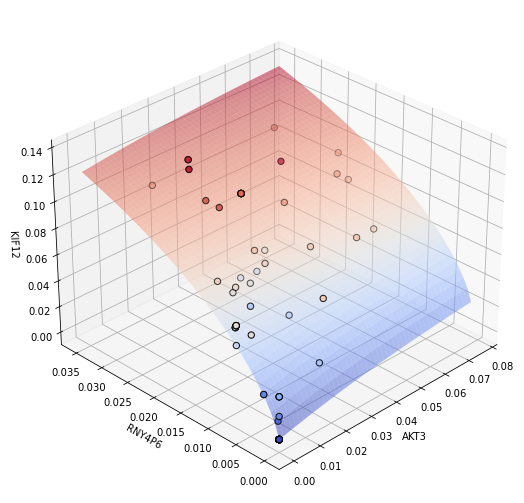

Inducer RNAs: AKT3 AL138752.2
Best model keywords: Dual_Activation
Best model AIC: -1303.0417531097562
Delta AIC: -204.82481041108372
Best model parameters: {'K_1': 0.022992493942122386, 'K_2': 0.013455105966618808, 'n_1': 2.159621016124919, 'n_2': 1.1246090763746144, 'alpha_1': 0.13025252062837697, 'alpha_2': 0.10563394148786413, 'alpha_3': 0.09596604252963181, 'alpha_4': 0.0010213820356276538}


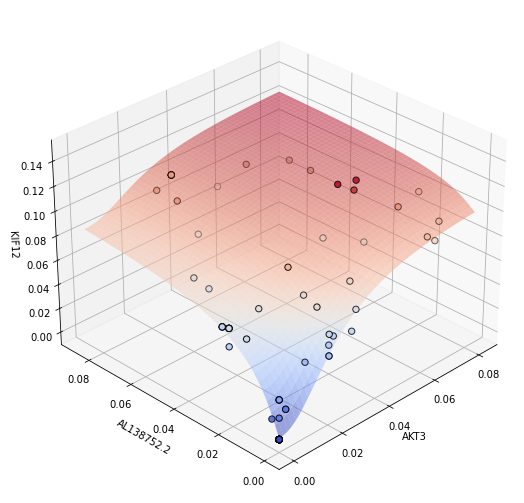

Inducer RNAs: TAS2R5 RNY4P6
Best model keywords: Dual_Activation
Best model AIC: -1338.1021786799677
Delta AIC: -237.2476358414865
Best model parameters: {'K_1': 0.3374458618040344, 'K_2': 0.06532795174310496, 'n_1': 1.2890545074420257, 'n_2': 0.7552112070110965, 'alpha_1': 0.3095248621282165, 'alpha_2': 0.1507418340207376, 'alpha_3': 0.3095248621282165, 'alpha_4': 0.0007749713744527327}


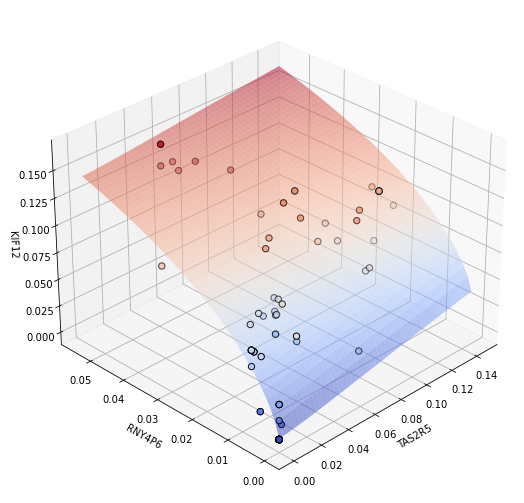

Inducer RNAs: TAS2R5 AL138752.2
Best model keywords: OR
Best model AIC: -1286.1463092713861
Delta AIC: -231.4409004628726
Best model parameters: {'K_1': 0.023283464853971855, 'K_2': 0.006744026984777637, 'n_1': 4.109366733616346, 'n_2': 6.036417044639684, 'alpha_1': 0.1182264775658843, 'alpha_2': 0.07096337817722155, 'alpha_3': 0.06505841915258981}


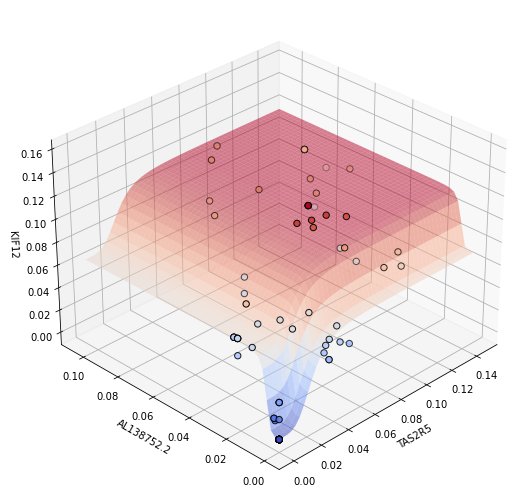

Inducer RNAs: AC090985.1 AL138752.2
Best model keywords: Dual_Activation
Best model AIC: -1293.5965401878402
Delta AIC: -207.25329689243858
Best model parameters: {'K_1': 0.03179620113601905, 'K_2': 0.007935396617963183, 'n_1': 1.8361411704768014, 'n_2': 1.4816213325859688, 'alpha_1': 0.1352597538026321, 'alpha_2': 0.09951837084091791, 'alpha_3': 0.08395199221503508, 'alpha_4': 0.0009401595629731348}


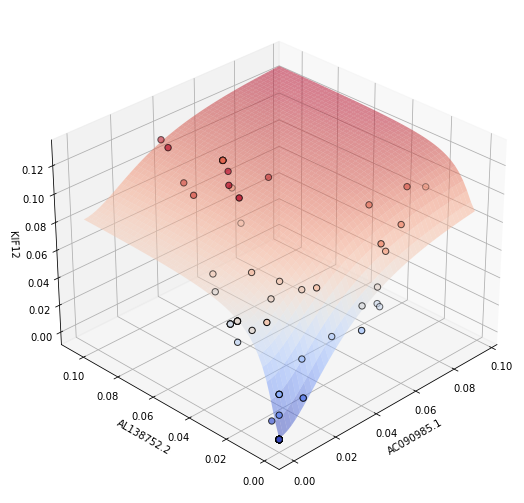

Inducer RNAs: BGLAP RNY4P6
Best model keywords: OR
Best model AIC: -1258.0099303829095
Delta AIC: -256.90575675517425
Best model parameters: {'K_1': 0.10976628386377275, 'K_2': 0.27779545408420925, 'n_1': 1.098248785181985, 'n_2': 0.6505000084426338, 'alpha_1': 0.6143371167071644, 'alpha_2': 0.044295171101850765, 'alpha_3': 0.6143371167071644}


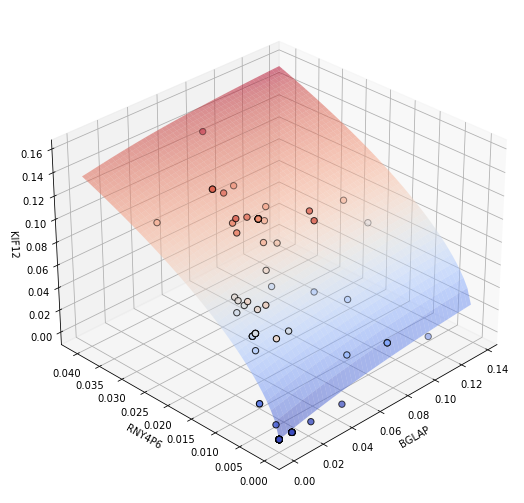

Inducer RNAs: PCDHGB5 LYG1
Best model keywords: OR
Best model AIC: -1323.9014028953422
Delta AIC: -245.6790685859121
Best model parameters: {'K_1': 0.032254589433863064, 'K_2': 0.017721110325870978, 'n_1': 4.671277934309271, 'n_2': 5.843324564603435, 'alpha_1': 0.11845798177354902, 'alpha_2': 0.118457981773549, 'alpha_3': 0.05972998029829753}


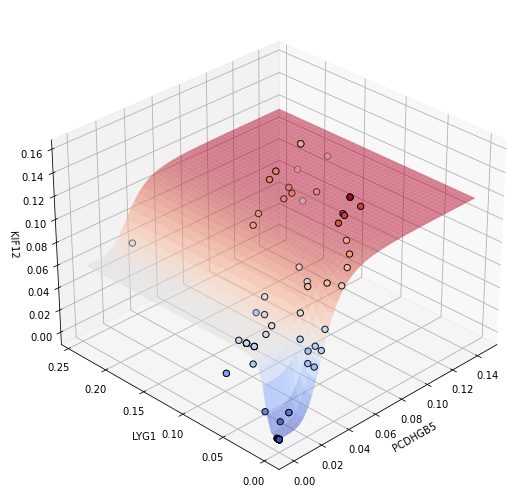

Inducer RNAs: PCDHGB5 RNU6-277P
Best model keywords: OR
Best model AIC: -1335.04276848985
Delta AIC: -230.27542711619526
Best model parameters: {'K_1': 0.03144241252096698, 'K_2': 0.06824653235989361, 'n_1': 4.358855475920211, 'n_2': 1.3696459317309426, 'alpha_1': 0.1201701484890939, 'alpha_2': 0.12017014848909385, 'alpha_3': 0.1201701484890939}


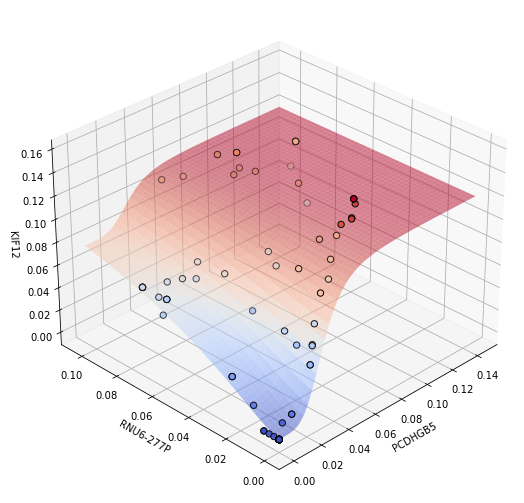

Inducer RNAs: AL049820.1 LINC00383
Best model keywords: Dual_Activation
Best model AIC: -1312.7592763754478
Delta AIC: -231.8729633384612
Best model parameters: {'K_1': 0.04227664275883198, 'K_2': 0.04488695136807012, 'n_1': 1.1610363700917161, 'n_2': 1.571642341035478, 'alpha_1': 0.18411241968530853, 'alpha_2': 0.10417247907543499, 'alpha_3': 0.1734935506098645, 'alpha_4': 0.0010052239348115582}


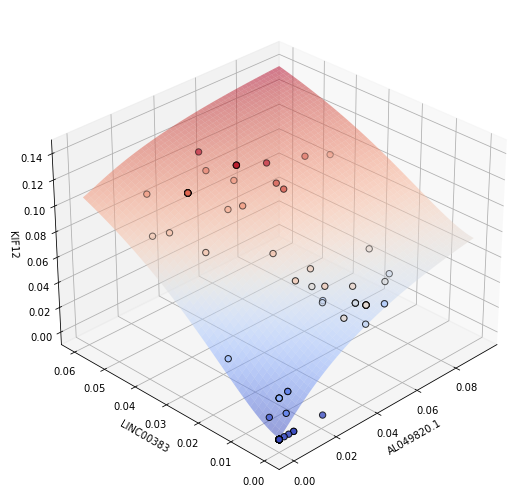

Inducer RNAs: TEX13B RNY4P6
Best model keywords: OR
Best model AIC: -1237.732133535373
Delta AIC: -234.70007462390015
Best model parameters: {'K_1': 0.03160192180808381, 'K_2': 0.06914249708064851, 'n_1': 1.174256098217523, 'n_2': 0.8753958331045111, 'alpha_1': 0.33048647404413767, 'alpha_2': 0.036173136541971226, 'alpha_3': 0.33048647404413767}


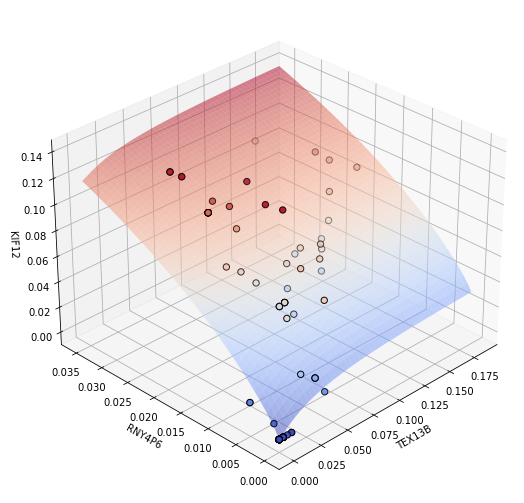

Inducer RNAs: TEX13B AL133368.1
Best model keywords: OR
Best model AIC: -1212.2626703405256
Delta AIC: -210.86654542310566
Best model parameters: {'K_1': 0.03191863913225253, 'K_2': 0.03329889287783038, 'n_1': 7.615013753790907, 'n_2': 6.913069143764786, 'alpha_1': 0.09833606385650431, 'alpha_2': 0.06593039882561286, 'alpha_3': 0.09833606385650451}


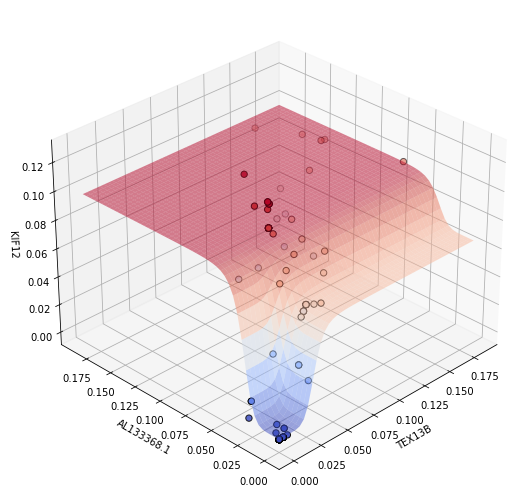

Inducer RNAs: AC013356.3 ASTL
Best model keywords: Dual_Activation
Best model AIC: -1393.6185510520288
Delta AIC: -219.97101684751965
Best model parameters: {'K_1': 0.033734650697315856, 'K_2': 0.0361590494114276, 'n_1': 1.7352564828978267, 'n_2': 3.12402649120328, 'alpha_1': 0.19736107882622428, 'alpha_2': 0.151698969457796, 'alpha_3': 0.09619800407306847, 'alpha_4': 0.0016276480418687806}


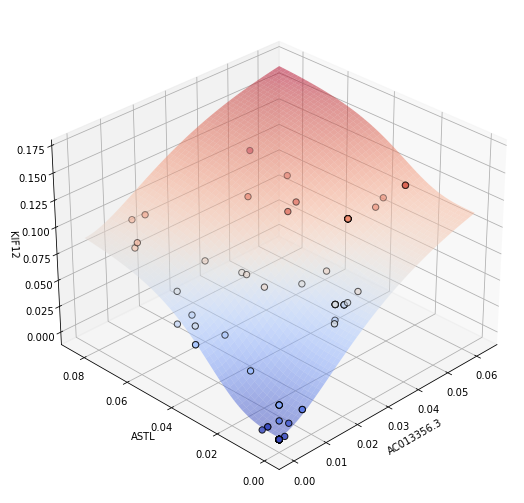

Inducer RNAs: AC013356.3 AKT3
Best model keywords: Dual_Activation
Best model AIC: -1404.83127617373
Delta AIC: -234.0293049890745
Best model parameters: {'K_1': 0.056611008299664825, 'K_2': 0.059330719152174013, 'n_1': 1.199696165987518, 'n_2': 1.0656732067587582, 'alpha_1': 0.1960475752049644, 'alpha_2': 0.19604757520496438, 'alpha_3': 0.16923062151457022, 'alpha_4': 0.0012471744576799562}


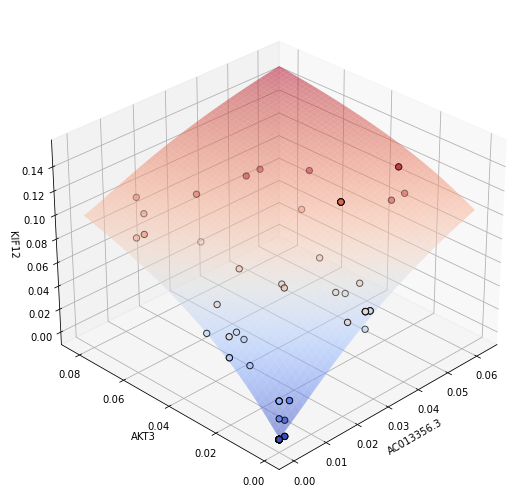

Inducer RNAs: AC078778.1 RNY4P6
Best model keywords: Dual_Activation
Best model AIC: -1376.6266398576429
Delta AIC: -284.8097904499898
Best model parameters: {'K_1': 0.2856431981089286, 'K_2': 0.12739131053398808, 'n_1': 0.9493584025331409, 'n_2': 1.0066900243371357, 'alpha_1': 0.879585134979824, 'alpha_2': 0.09725932467514375, 'alpha_3': 0.31067665437529735, 'alpha_4': -1.738354010247805e-17}


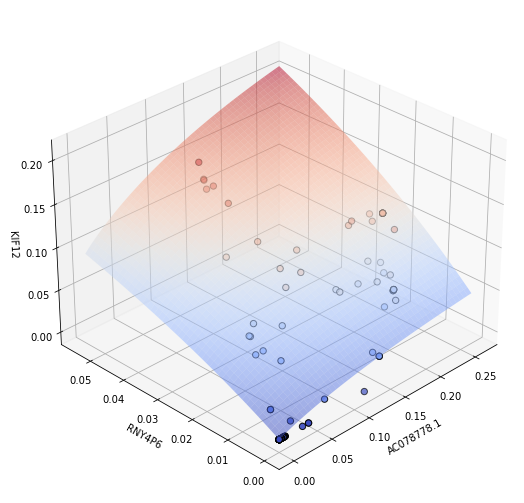

Inducer RNAs: AC011352.2 AC005306.1
Best model keywords: OR
Best model AIC: -1267.0987851728971
Delta AIC: -210.10154566757205
Best model parameters: {'K_1': 0.0582708246697274, 'K_2': 0.07582135171054447, 'n_1': 1.151939212604386, 'n_2': 0.5317214987418464, 'alpha_1': 0.26260456421847295, 'alpha_2': -0.031530689004719635, 'alpha_3': 0.262604564218473}


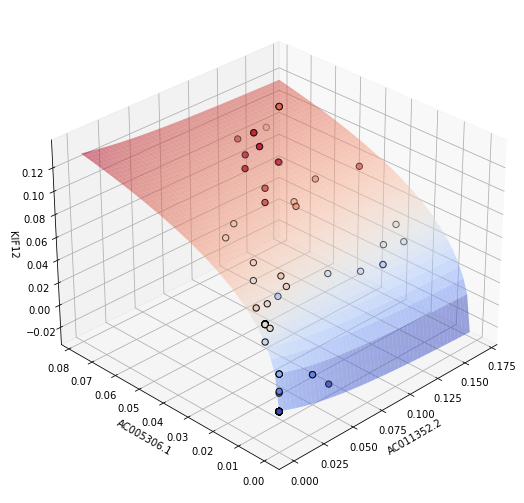

Inducer RNAs: AC011352.2 AC013356.3
Best model keywords: OR
Best model AIC: -1278.9299656616301
Delta AIC: -204.46015607686581
Best model parameters: {'K_1': 0.07294306606068149, 'K_2': 0.007656617436473863, 'n_1': 1.2229754506186403, 'n_2': 1.2627328034668632, 'alpha_1': 0.1439569743996655, 'alpha_2': 0.07336255520625101, 'alpha_3': 0.07679927729815737}


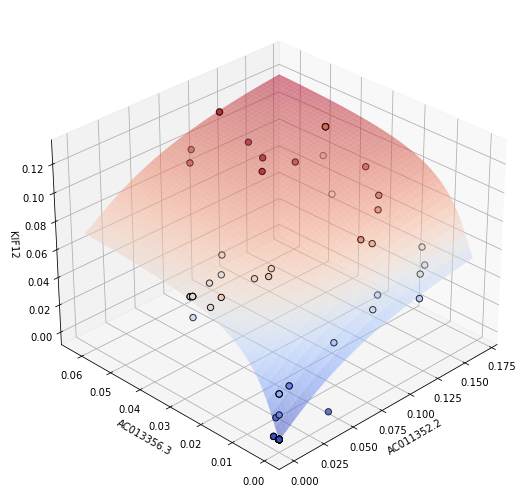

Inducer RNAs: RNU6-31P ENSG00000280887
Best model keywords: Dual_Activation
Best model AIC: -1263.409618021314
Delta AIC: -219.93872441740928
Best model parameters: {'K_1': 0.022806666403264564, 'K_2': 0.007534921352639642, 'n_1': 2.1766884720572253, 'n_2': 1.141939817240218, 'alpha_1': 0.1689024690234148, 'alpha_2': 0.034166211768414154, 'alpha_3': 0.00097100723011298, 'alpha_4': 0.00012748056849276948}


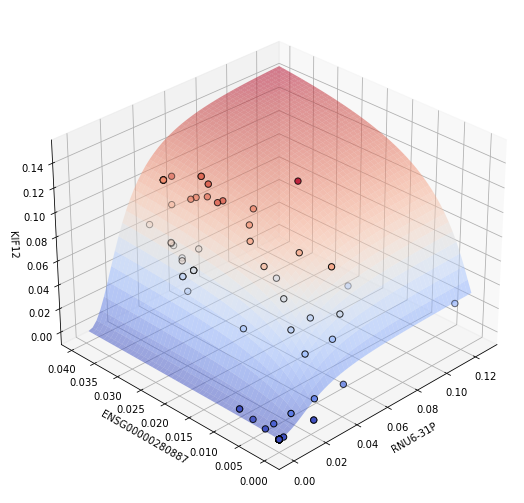

Inducer RNAs: RNU6-31P RNY4P6
Best model keywords: OR
Best model AIC: -1247.6341394514525
Delta AIC: -235.96966504291754
Best model parameters: {'K_1': 0.02847692973737712, 'K_2': 0.11051576525827608, 'n_1': 1.138289650823342, 'n_2': 0.7933337201587924, 'alpha_1': 0.415211494049999, 'alpha_2': 0.03925681782861554, 'alpha_3': 0.415211494049999}


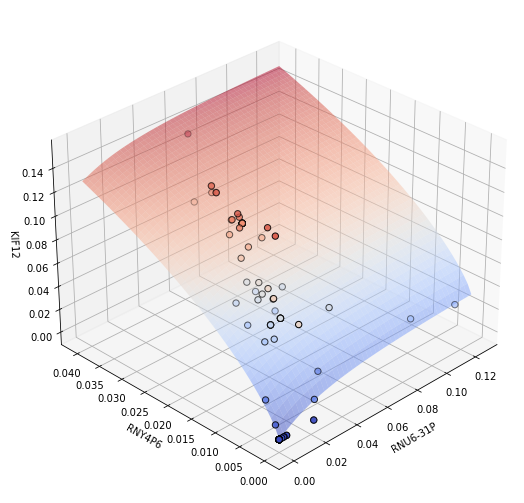

Inducer RNAs: Y_RNA AC087627.1
Best model keywords: AND
Best model AIC: -1267.405716344542
Delta AIC: -246.65590884226094
Best model parameters: {'K_1': 0.02851243597377719, 'K_2': 0.02060915966176358, 'n_1': 1.7767049319981492, 'n_2': 2.2721260412862656, 'alpha_1': 0.19558560577817902}


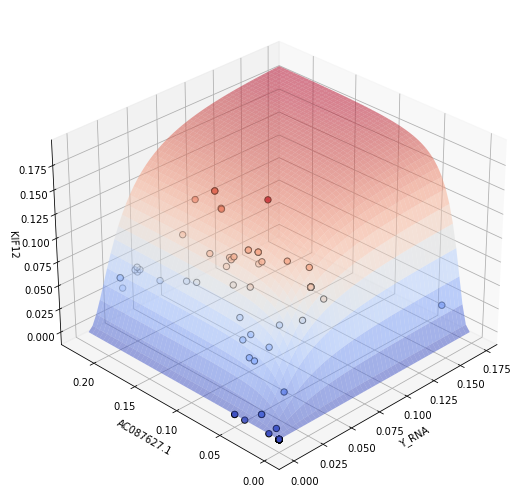

Inducer RNAs: Y_RNA SEZ6L
Best model keywords: OR
Best model AIC: -1214.2312274302972
Delta AIC: -228.667561554372
Best model parameters: {'K_1': 0.07226750876216143, 'K_2': 0.06177689363562123, 'n_1': 0.42896360289675806, 'n_2': 0.16021099593260058, 'alpha_1': 0.3874347561418737, 'alpha_2': 0.09536289363490022, 'alpha_3': 1.0497658130385445e-17}


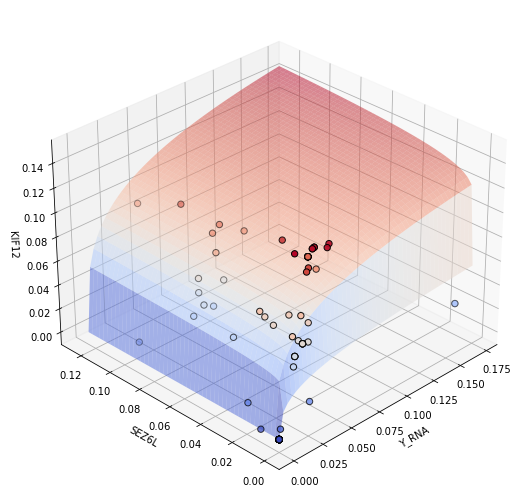

Inducer RNAs: AC020558.2 CSRP1
Best model keywords: OR
Best model AIC: -1236.9193561240218
Delta AIC: -204.05006638956138
Best model parameters: {'K_1': 0.16866186009043188, 'K_2': 0.06497262166577733, 'n_1': 1.0057890607915734, 'n_2': 0.2739529765295963, 'alpha_1': 0.8484555473308888, 'alpha_2': -0.0005407909300143649, 'alpha_3': 0.037091461075613605}


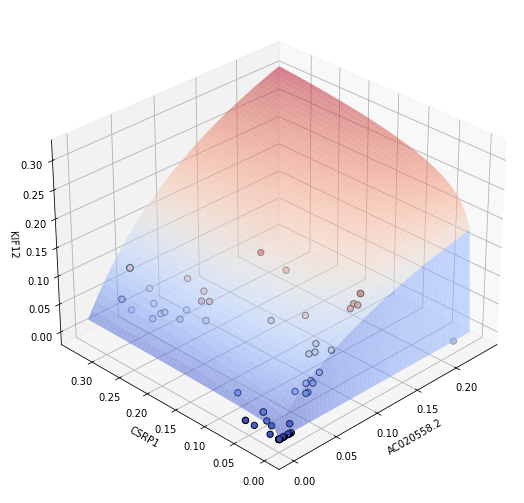

Inducer RNAs: MIR3173 APOA1-AS
Best model keywords: IMPLY21
Best model AIC: -1200.2411051456293
Delta AIC: -216.54098570936526
Best model parameters: {'K_1': 0.020876520086587975, 'K_2': 0.005195758263649053, 'n_1': 1.5516864929518015, 'n_2': 1.2993111010118452, 'alpha_1': 0.012958636120635357, 'alpha_3': 0.1299769569037594, 'alpha_4': 0.004689426196319018}


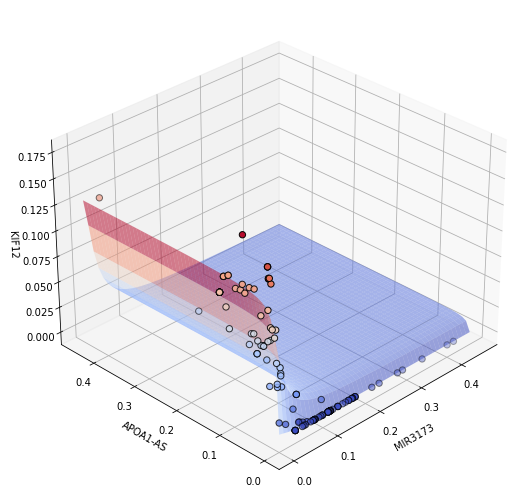

Inducer RNAs: MIR3173 ASXL3
Best model keywords: IMPLY12
Best model AIC: -1187.2504755835917
Delta AIC: -215.8911912496461
Best model parameters: {'K_1': 0.0095271241288243, 'K_2': 0.9256011823167706, 'n_1': 1.713659799161327, 'n_2': 1.3831450320679355, 'alpha_1': 0.5993122336343107, 'alpha_2': -0.001827706708825654, 'alpha_4': 0.1325076552004159}


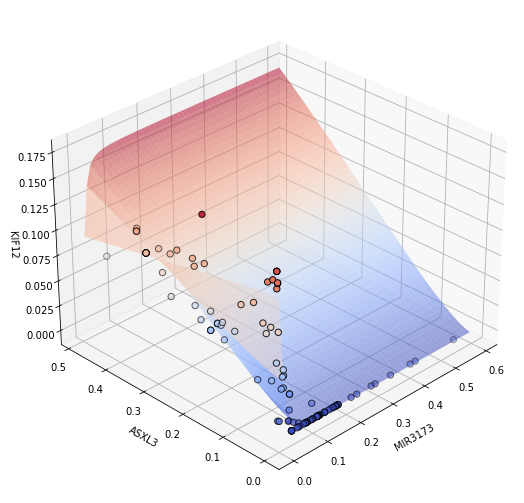

Inducer RNAs: MIR3173 LYG1
Best model keywords: IMPLY21
Best model AIC: -1197.2008137634966
Delta AIC: -212.32299652160907
Best model parameters: {'K_1': 0.026217014615692355, 'K_2': 0.004697967465252692, 'n_1': 1.5542409282845673, 'n_2': 1.4364366846641095, 'alpha_1': -0.0001732959787171702, 'alpha_3': 0.12468463379565024, 'alpha_4': 0.009685086660467529}


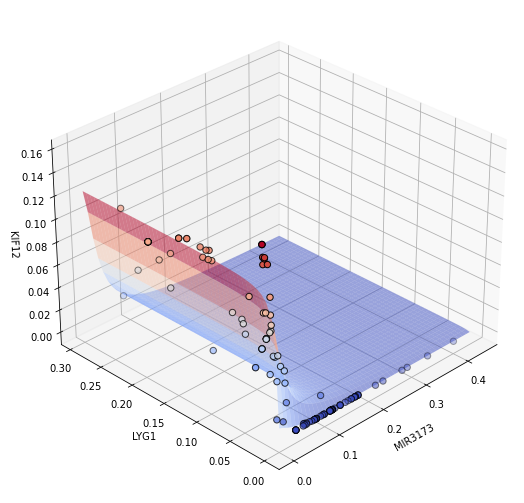

Inducer RNAs: MIR3173 AL138752.2
Best model keywords: IMPLY21
Best model AIC: -1195.9680263861944
Delta AIC: -223.28704622799148
Best model parameters: {'K_1': 0.009502829708021271, 'K_2': 0.044668480639113606, 'n_1': 1.809802539015309, 'n_2': 1.1004601070255116, 'alpha_1': 0.17253843723296305, 'alpha_3': 0.11113479431026067, 'alpha_4': 0.12423405908142773}


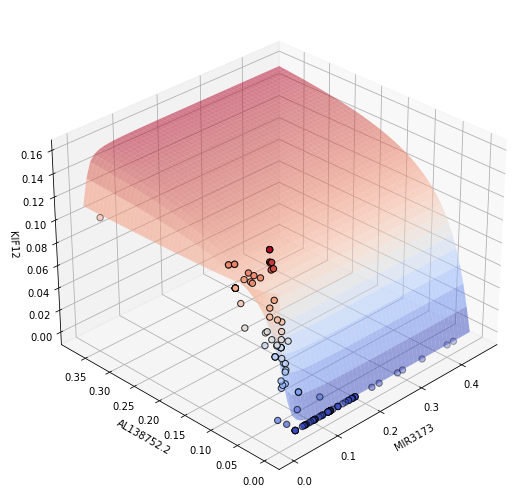

Inducer RNAs: MIR3173 ENSG00000270750
Best model keywords: IMPLY21
Best model AIC: -1191.5491328882715
Delta AIC: -266.09483712160136
Best model parameters: {'K_1': 0.014317724157541468, 'K_2': 0.00611509716844272, 'n_1': 1.8083803536070002, 'n_2': 1.2822140810278695, 'alpha_1': 0.029895535314597235, 'alpha_3': 0.12857531236144443, 'alpha_4': 0.009863080843253009}


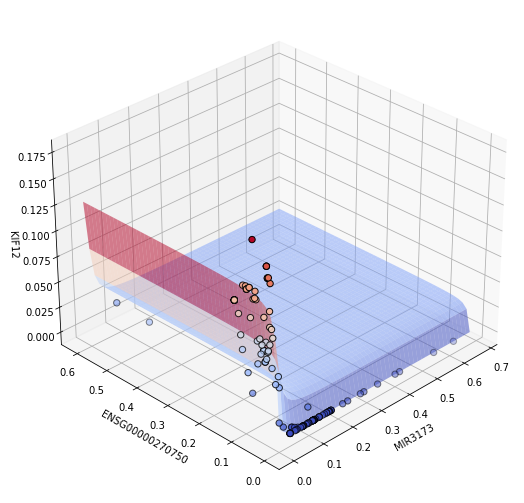

Inducer RNAs: MIR3173 AC087627.1
Best model keywords: IMPLY21
Best model AIC: -1219.1312738550578
Delta AIC: -253.90692406805067
Best model parameters: {'K_1': 0.026141051898182503, 'K_2': 0.018623464202385975, 'n_1': 1.028708268361571, 'n_2': 1.2072804877572596, 'alpha_1': -0.03295652601872778, 'alpha_3': 0.15899611560127763, 'alpha_4': -6.101999468596193e-20}


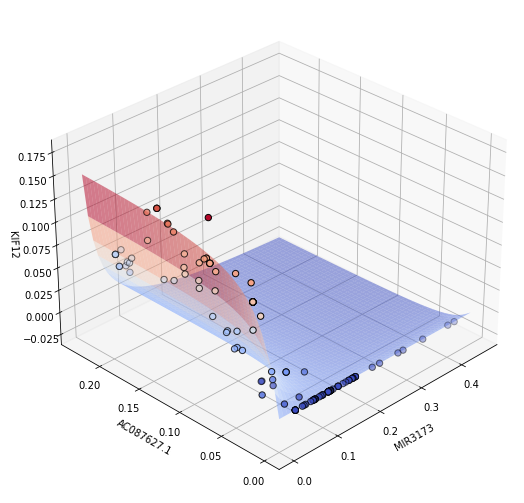

Inducer RNAs: MIR3173 CSRP1
Best model keywords: IMPLY21
Best model AIC: -1189.7031140926708
Delta AIC: -233.0991542184206
Best model parameters: {'K_1': 0.021255823189661797, 'K_2': 0.002062562716073098, 'n_1': 1.483195265320972, 'n_2': 1.3016474162031133, 'alpha_1': -0.0027001147784765666, 'alpha_3': 0.12601532275935884, 'alpha_4': -3.909917271895248e-19}


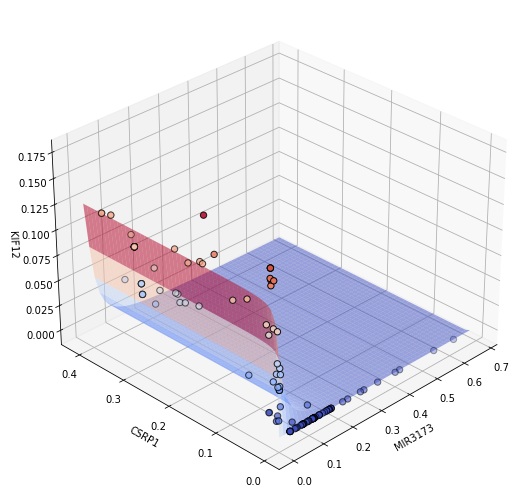

Inducer RNAs: MIR3173 MIR3174
Best model keywords: IMPLY21
Best model AIC: -1208.3764257353287
Delta AIC: -272.6005801377437
Best model parameters: {'K_1': 0.024032659226744663, 'K_2': 0.003238512539925087, 'n_1': 1.1923703278330193, 'n_2': 3.3065672595020046, 'alpha_1': 0.0017093608375137095, 'alpha_3': 0.12446499060737674, 'alpha_4': 0.003678900638589973}


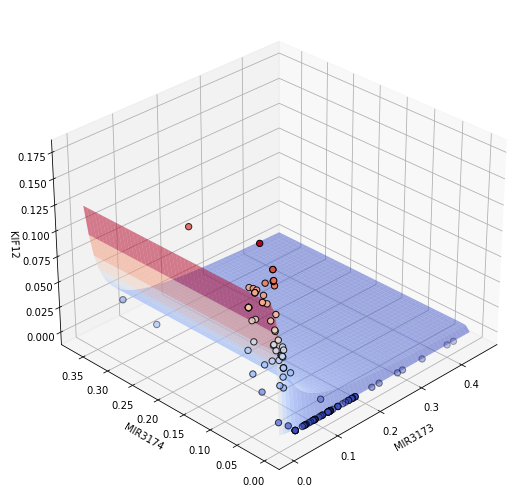

Inducer RNAs: MIR3173 L3MBTL2-AS1
Best model keywords: IMPLY21
Best model AIC: -1217.8365863851475
Delta AIC: -214.05932453852927
Best model parameters: {'K_1': 0.013517685858225282, 'K_2': 0.029386046166635146, 'n_1': 1.0683922592695243, 'n_2': 2.591744571955935, 'alpha_1': 0.035205550133072416, 'alpha_3': 0.13859937171315323, 'alpha_4': 1.0657107188400893e-17}


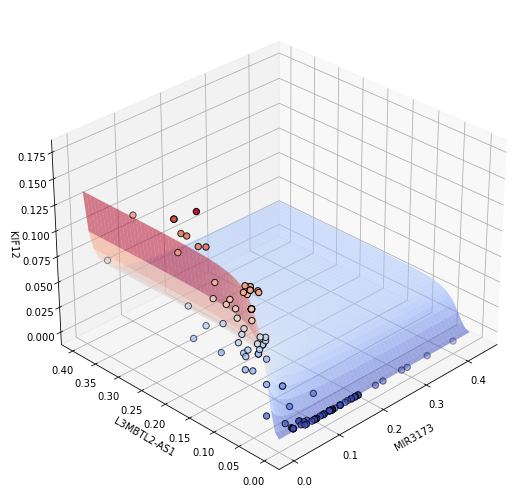

Inducer RNAs: MIR3173 AL136140.1
Best model keywords: IMPLY21
Best model AIC: -1176.802644081445
Delta AIC: -202.60532250209405
Best model parameters: {'K_1': 0.011947960219590966, 'K_2': 0.005298905321738636, 'n_1': 1.5124040427916565, 'n_2': 0.9142912974198565, 'alpha_1': 0.038084216727356825, 'alpha_3': 0.1390884227554511, 'alpha_4': 0.04863774036401143}


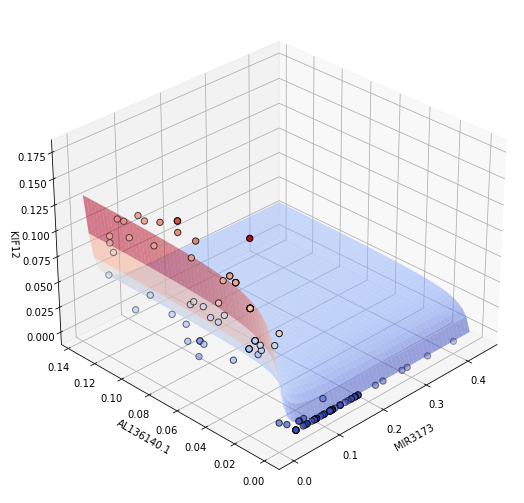

Inducer RNAs: MIR3173 AC013356.3
Best model keywords: IMPLY21
Best model AIC: -1219.8196000708028
Delta AIC: -225.26764206263977
Best model parameters: {'K_1': 0.016781240248916227, 'K_2': 0.044782837443435405, 'n_1': 1.974931651516642, 'n_2': 0.716896470049432, 'alpha_1': 0.09805435593879623, 'alpha_3': 0.1886504614315393, 'alpha_4': 0.0636306834657402}


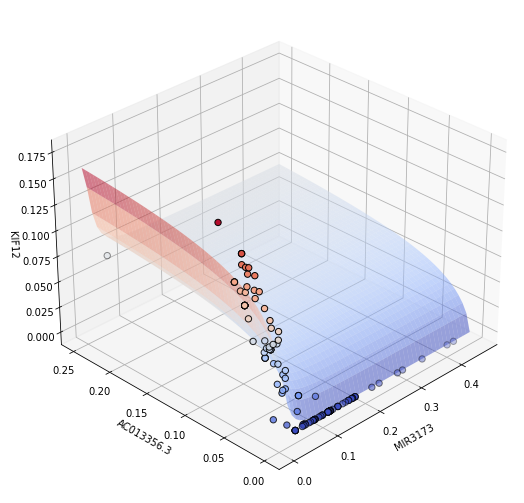

Inducer RNAs: MIR3173 RNU6-31P
Best model keywords: IMPLY21
Best model AIC: -1157.6328334409166
Delta AIC: -215.80475609758696
Best model parameters: {'K_1': 0.02749150923468807, 'K_2': 0.05663505613762036, 'n_1': 1.7958435761517766, 'n_2': 0.4013121737140832, 'alpha_1': -0.006128408013337182, 'alpha_3': 0.24212790451221963, 'alpha_4': 8.673617379884035e-19}


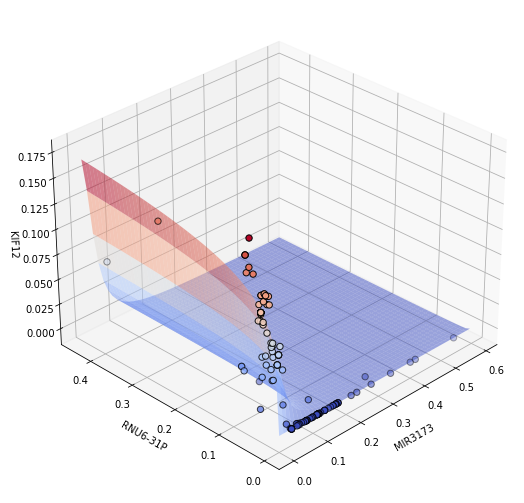

Inducer RNAs: MIR3173 Y_RNA
Best model keywords: IMPLY21
Best model AIC: -1206.5537017290897
Delta AIC: -235.19724298097128
Best model parameters: {'K_1': 0.032127186954639696, 'K_2': 0.2081250880851544, 'n_1': 2.439339325409751, 'n_2': 0.4575739850694555, 'alpha_1': -0.017400154211530475, 'alpha_3': 0.35535122253784823, 'alpha_4': 3.3384084928129906e-19}


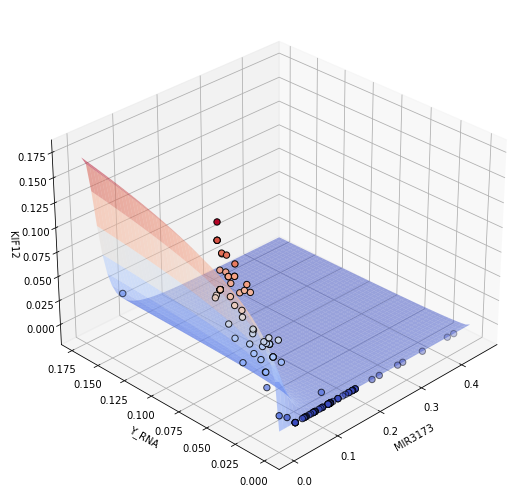

Inducer RNAs: MIR3173 PAX7
Best model keywords: IMPLY21
Best model AIC: -1279.8308627058193
Delta AIC: -277.7196121210417
Best model parameters: {'K_1': 0.01554216329031663, 'K_2': 0.09816298201149784, 'n_1': 2.2568566323136863, 'n_2': 1.3878193601722586, 'alpha_1': 0.1134105487110881, 'alpha_3': 0.2341747289673761, 'alpha_4': 0.0787743581868708}


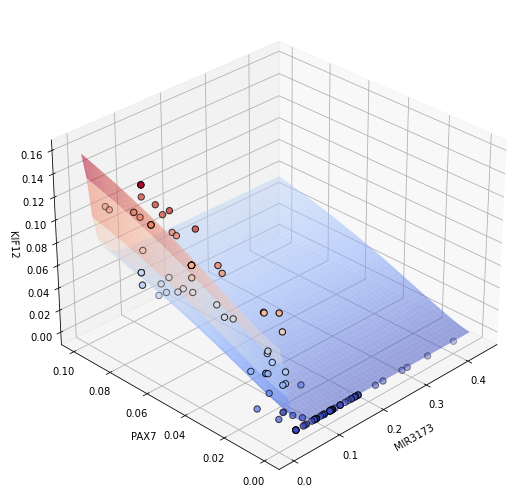

Inducer RNAs: CELA2B Y_RNA
Best model keywords: AND
Best model AIC: -1322.9420697698736
Delta AIC: -209.5905704215795
Best model parameters: {'K_1': 0.003644203818248992, 'K_2': 0.012154132526594856, 'n_1': 0.9624928248063994, 'n_2': 1.282628840265783, 'alpha_1': 0.1495221816110194}


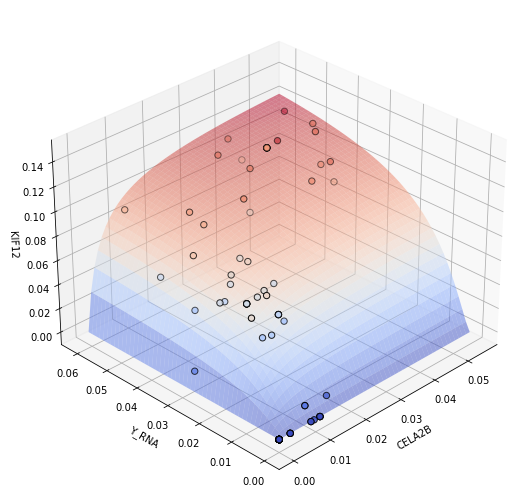

Inducer RNAs: MFFP1 MIR3173
Best model keywords: IMPLY12
Best model AIC: -1298.7904126545227
Delta AIC: -331.4506287189871
Best model parameters: {'K_1': 0.15585724376880272, 'K_2': 0.051898396415523226, 'n_1': 0.8690768086263442, 'n_2': 1.8503520852965316, 'alpha_1': -0.13037661689932778, 'alpha_2': 0.48619827834163964, 'alpha_4': 0.005398650386243698}


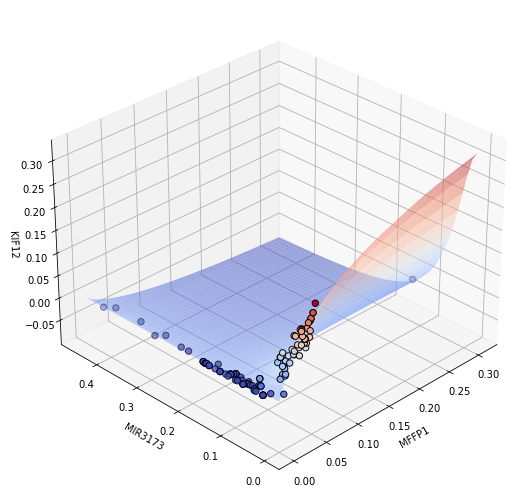

Inducer RNAs: RUNX3 ENSG00000280887
Best model keywords: OR
Best model AIC: -1258.094368048066
Delta AIC: -207.99212856557938
Best model parameters: {'K_1': 0.07400853213069133, 'K_2': 0.13805924103446873, 'n_1': 1.3573847066668963, 'n_2': 0.5741208431447795, 'alpha_1': 0.5536837561616643, 'alpha_2': 0.028540242509357376, 'alpha_3': 0.0476225365588364}


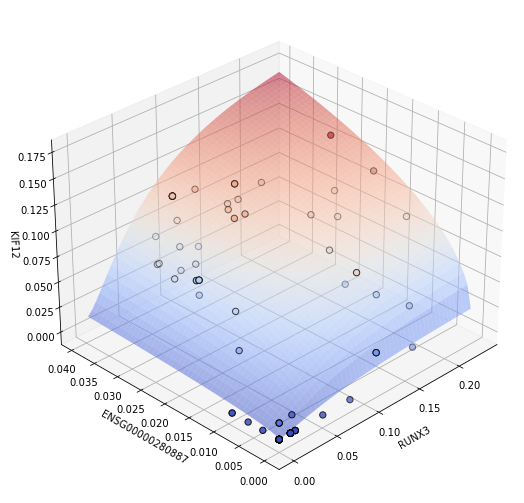

Inducer RNAs: RUNX3 RNY4P6
Best model keywords: OR
Best model AIC: -1261.303182137496
Delta AIC: -225.60189871213947
Best model parameters: {'K_1': 0.08231962327792318, 'K_2': 0.10514423735592507, 'n_1': 1.1126525678867607, 'n_2': 0.693099401636806, 'alpha_1': 0.3890478832649628, 'alpha_2': 0.027494560740803867, 'alpha_3': 0.3890478832649628}


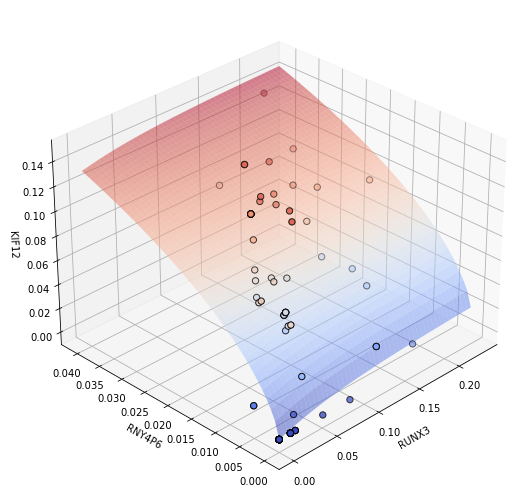

Inducer RNAs: RUNX3 SYS1-DBNDD2
Best model keywords: Dual_Activation
Best model AIC: -1294.9262325622635
Delta AIC: -244.98584911155876
Best model parameters: {'K_1': 0.019316041080826084, 'K_2': 0.06694068955170454, 'n_1': 1.0368266768808263, 'n_2': 0.34820435805750405, 'alpha_1': 0.28340989784009224, 'alpha_2': 0.016997188054475292, 'alpha_3': 0.0179281420935236, 'alpha_4': -1.3904388858977273e-17}


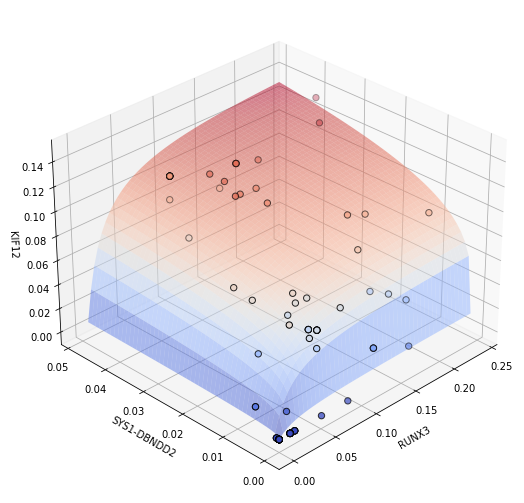

Inducer RNAs: RUNX3 RN7SL502P
Best model keywords: OR
Best model AIC: -1257.1923016253108
Delta AIC: -200.6864438491325
Best model parameters: {'K_1': 0.08169319069956683, 'K_2': 0.07494233750043469, 'n_1': 1.17724678970913, 'n_2': 0.9935120208961983, 'alpha_1': 0.2240572288944318, 'alpha_2': 0.03004516168068544, 'alpha_3': 0.2240572288944318}


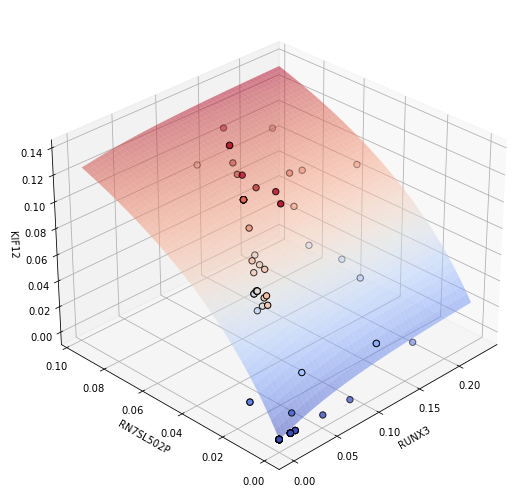

Inducer RNAs: RUNX3 MFFP1
Best model keywords: AND
Best model AIC: -1324.7049706106945
Delta AIC: -280.4746100452003
Best model parameters: {'K_1': 0.02619418407626882, 'K_2': 0.04097614879107294, 'n_1': 1.4027994254324934, 'n_2': 1.3405077602564799, 'alpha_1': 0.26954428658481316}


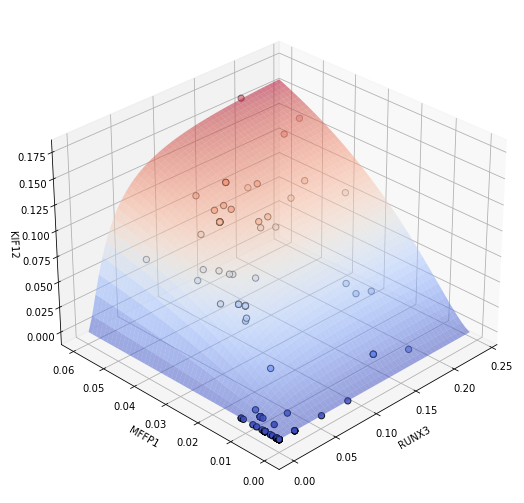

Inducer RNAs: AC024610.2 RNY4P6
Best model keywords: Dual_Activation
Best model AIC: -1360.6079065920949
Delta AIC: -214.19544526799905
Best model parameters: {'K_1': 0.11904635123979014, 'K_2': 2.1386052773409316, 'n_1': 1.0536283128449329, 'n_2': 0.642499478805521, 'alpha_1': 2.5729394900678804, 'alpha_2': 0.035067429859441626, 'alpha_3': 0.04217929361759052, 'alpha_4': 1.979869832136901e-18}


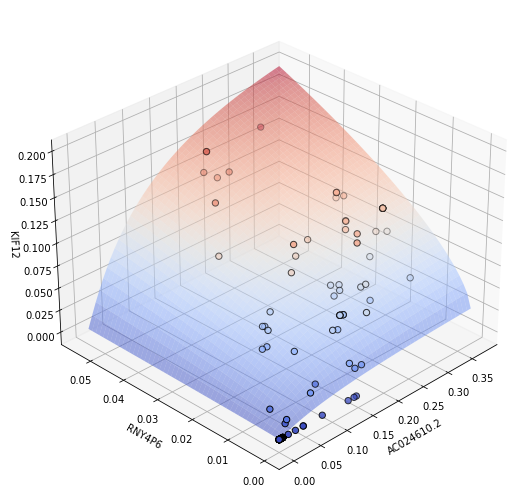

Inducer RNAs: MTND2P32 SYS1-DBNDD2
Best model keywords: AND
Best model AIC: -1316.0308004561234
Delta AIC: -214.64100247231863
Best model parameters: {'K_1': 0.024624041018596447, 'K_2': 0.007464491925834965, 'n_1': 1.4483729419174851, 'n_2': 0.3984935780969505, 'alpha_1': 0.24037203829549567}


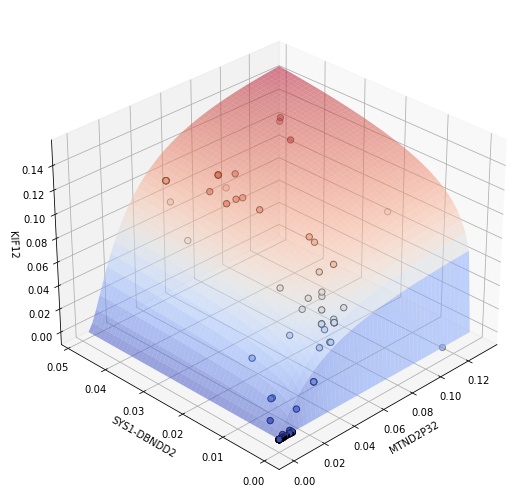

Inducer RNAs: MTND2P32 MIR3173
Best model keywords: NOR
Best model AIC: -1249.110033131157
Delta AIC: -256.15290134400414
Best model parameters: {'K_1': 0.019874086714142033, 'K_2': 0.02848868430897972, 'n_1': -1.4730045005952892, 'n_2': 1.3752728631475288, 'alpha_4': 0.14738665104237264}


..\biologiclib\plotUtils.py:64: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  ax.plot_surface(*grid, mu,


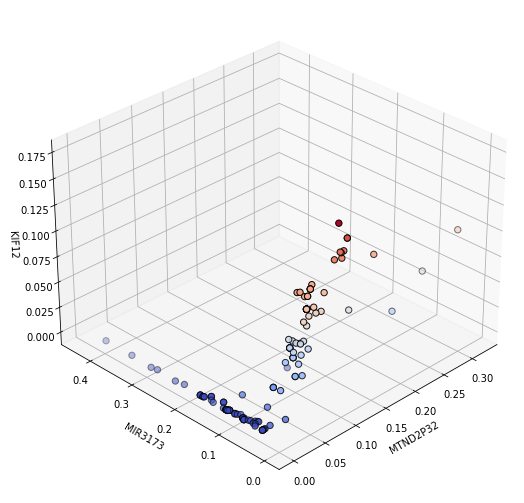

Inducer RNAs: AC083964.2 MIR3173
Best model keywords: IMPLY12
Best model AIC: -1184.9423378297704
Delta AIC: -240.08327926502977
Best model parameters: {'K_1': 0.005016485043383899, 'K_2': 0.0339154745219693, 'n_1': 1.0368862424726741, 'n_2': 1.2099861152860154, 'alpha_1': -0.029633979735169104, 'alpha_2': 0.13567811358568646, 'alpha_4': -3.3587996313494765e-18}


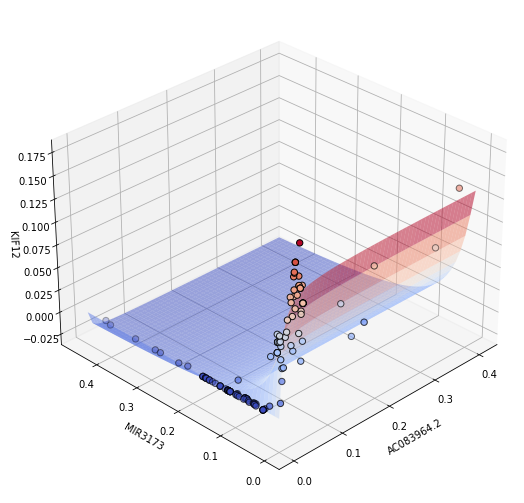

Inducer RNAs: AC083964.2 MFFP1
Best model keywords: OR
Best model AIC: -1317.8590843839656
Delta AIC: -293.62474194942865
Best model parameters: {'K_1': 0.007148751501659742, 'K_2': 0.326552087685453, 'n_1': 1.039332227275541, 'n_2': 1.0923126398434935, 'alpha_1': 1.2786213495721528, 'alpha_2': 0.014511318233815795, 'alpha_3': 0.21793938526540443}


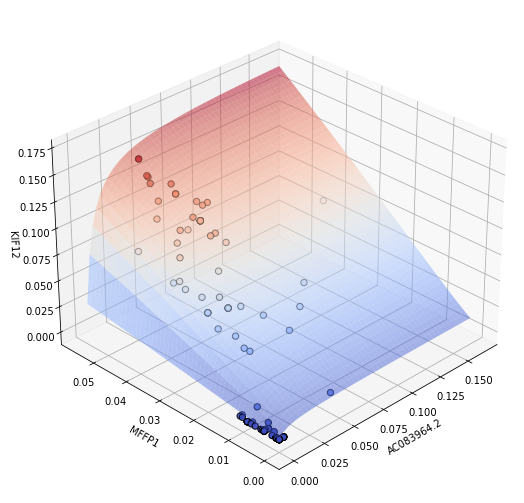

Inducer RNAs: CCDC189 AC013356.3
Best model keywords: OR
Best model AIC: -1444.7506836448101
Delta AIC: -277.49187484739514
Best model parameters: {'K_1': 0.052450009273571754, 'K_2': 0.08616727792172935, 'n_1': 1.857434121551976, 'n_2': 0.892529992712037, 'alpha_1': 0.2685277035106515, 'alpha_2': 0.13017296558101615, 'alpha_3': 0.19675314568532887}


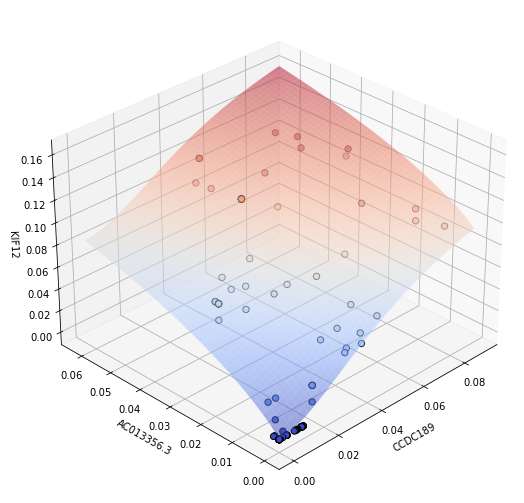

Inducer RNAs: CCDC189 MIR3173
Best model keywords: IMPLY12
Best model AIC: -1191.9189573168478
Delta AIC: -209.38335938825583
Best model parameters: {'K_1': 0.025056945885887014, 'K_2': 0.04163376487821199, 'n_1': 0.7282154190547113, 'n_2': 1.5226189602153752, 'alpha_1': -0.035152306808276114, 'alpha_2': 0.18627963790981014, 'alpha_4': 0.0009460025459579671}


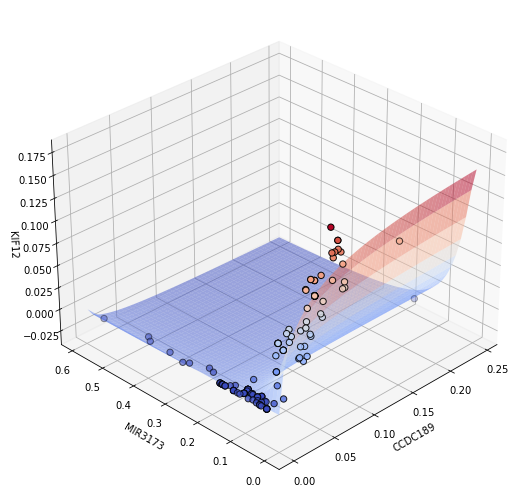

In [13]:
# plot rigid dual logic gates

for _, (id_inducer_1, id_inducer_2, symbol_inducer_1, symbol_inducer_2, id_reporter, symbol_reporter) in\
    rigid_detected_dual_logi[["id_inducer_1", "id_inducer_2",
                              "symbol_inducer_1", "symbol_inducer_2", "id_reporter", "symbol_reporter"]].iterrows():
    count_x_all = (
        h9_exp_mat.loc[id_inducer_1].to_numpy(),
        h9_exp_mat.loc[id_inducer_2].to_numpy())
    count_y_all = h9_exp_mat.loc[id_reporter]
    
    # outlier removal
    count_x = [0.0, 0.0]
    count_x[0], count_x[1], count_y = remove_outliers_3d(*count_x_all, count_y_all)

    # fitting
    count_x = np.array(count_x).transpose()    # convert to column vectors
    start_time = time.time()
    best_model, all_models = selectModel(count_x,
                                count_y,
                                modelSolver = ModelSolver.SLSQP,
                                modelSet = ModelSet.Dual_Input,
                                parallel = False,
                                quiet = True)

    # printing
    specs, AIC, Delta_AIC, theta = extract_results(best_model, all_models)
    specs = ', '.join(specs)
    best_model_specs = [spec.name for spec in best_model.modelSpecs]
    print("Inducer RNAs:", symbol_inducer_1, symbol_inducer_2)
    print("Best model keywords:", specs)
    print("Best model AIC:", AIC)
    print("Delta AIC:", Delta_AIC)
    print("Best model parameters:", theta)

    # plot
    fig = plt.figure(figsize = (12, 9))
    ax = fig.gca(projection = "3d")
    plotHelper3D(count_x,
            count_y,
            best_model,
            ax = ax,
            inducer_name = (symbol_inducer_1, symbol_inducer_2),
            reporter_name = symbol_reporter,
            logScale = False,
            s = 40,
            cmap = 'coolwarm', c = count_y,
            edgecolors = 'k')